# Mission


 
## Comment allez-vous procéder ? 
 
Cette mission suit un scénario de projet professionnel.

Vous pouvez suivre les étapes pour vous aider à réaliser vos livrables.
 

Avant de démarrer, nous vous conseillons de :

- lire toute la mission et ses documents liés ;
- prendre des notes sur ce que vous avez compris ;
- consulter les étapes pour vous guider ; 
- préparer une liste de questions pour votre première session de mentorat.

## Prêt à mener la mission ? 

**Future Vision Transport** est une entreprise qui conçoit des systèmes embarqués de vision par ordinateur pour les véhicules autonomes. 

Vous êtes l’un des ingénieurs IA au sein de l’équipe R&D de cette entreprise. Votre équipe est composée d’ingénieurs aux profils variés. 

Chacun des membres de l’équipe est spécialisé sur une des parties du système embarqué de vision par ordinateur. 

Voici les différentes parties du système :

- acquisition des images en temps réel
- traitement des images
- segmentation des images (c’est vous !)
- système de décision

Vous travaillez sur **la partie de segmentation des images** (3) qui est **alimentée par le bloc de traitement des images** (2) et **qui alimente le système de décision**(4).

Votre rôle est de **concevoir un premier modèle de segmentation d’images** qui devra s’intégrer facilement dans la chaîne complète du système embarqué.

Lors d’une première phase de cadrage, vous avez récolté les avis de Franck et Laura, qui travaillent sur les parties avant et après votre intervention :

* Franck, en charge du traitement des images (2) :

Le jeu de données que Franck utilise est disponible à ce lien, ou en téléchargement direct à ces liens : 1 ou 2, (images segmentées et annotées de caméras embarquées).

 On a uniquement besoin des **8 catégories principales**(et non pas des 32 sous-catégories)

* Laura, en charge du système de décision (4)

**Souhaite une API simple à utiliser.**
L’API prend en entrée une image et renvoie la segmentation de l’image de l’algo.

![Capture d’écran 2025-06-06 à 11.29.56.png](<attachment:Capture d’écran 2025-06-06 à 11.29.56.png>)

Pour récapituler, vous avez dressé un plan d’action, avec les points suivants :

- **entraîner un modèle de segmentation des images sur les 8 catégories principales.** *Keras* est le framework de travail commun à toute l’équipe. Attention aux contraintes de Franck !
- **concevoir une API de prédiction (Flask ou FastAPI)** qui sera utilisée par Laura **et la déployer sur le Cloud**(Azure, Heroku, PythonAnywhere ou toute autre solution). Cette API prend en entrée une image et renvoie le mask prédit (segments prédits de l’image).
- **concevoir une application web (Flask, Streamlit) de présentation des résultats** **et la déployer sur le Cloud** (Azure, Heroku, PythonAnywhere ou toute autre solution). Cette application sera **l’interface pour tester l’API et afficher les images et masks**.
 

# Livrables

1. **Les scripts développés sur un notebook permettant l’exécution du pipeline complet** :
    - Ce livrable vous servira à présenter le caractère “industrialisable” de votre travail en particulier le générateur de données.

2. **Une API (Flask ou FastAPI) déployée sur le Cloud** (Azure, Heroku, PythonAnywhere ou toute autre solution), pour exposer votre modèle entraîné et qui recevra en entrée une image et retournera le mask prédit (les segments identifiés par votre modèle) :
    - Ce livrable permettra à Laura d’utiliser facilement votre modèle.

3. **Une application (Flask, Streamlit) de présentation des résultats qui consomme l’API de prédiction, déployée sur le Cloud** (Azure, Heroku, PythonAnywhere ou toute autre solution). Cette application sera *l’interface pour tester l’API et intégrera les fonctionnalités suivantes* : 
    - affichage de la **liste des id** des images disponibles, 
    - lancement de la **prédiction du mask** pour l’id sélectionné par appel à l’API, 
    - et **affichage de l’image réelle, du mask réel et du mask prédit.** 
    - Ce livrable permettra d’illustrer votre travail auprès de vos collègues
4. **Une note technique de 10 pages** environ contenant :
    - une présentation des **différentes approches** 
    - et une synthèse de **l’état de l’art**, 
    - la présentation plus détaillée du **modèle** et de **l’architecture** retenue, 
    - une **synthèse des résultats** obtenus (incluant les gains obtenus avec les approches d’augmentation des données) 
    - et une **conclusion** avec des pistes d’amélioration envisageables.
    - Ce livrable vous servira à présenter votre démarche technique à vos collègues.
5. **Un support de présentation** (type Power Point) de votre démarche méthodologique **(30 slides maximum)** :
    - Ce livrable vous permettra de présenter vos résultats à Laura.


  
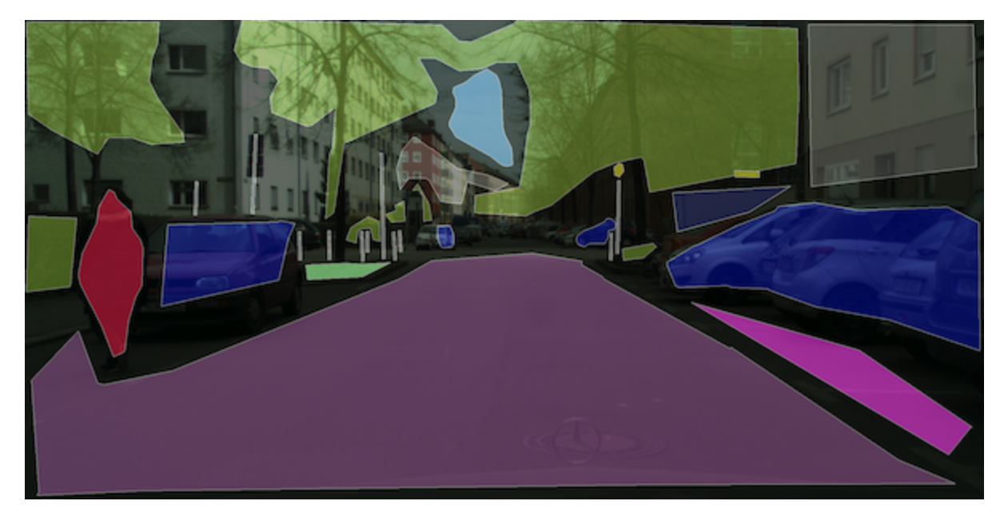

# Imports

# Standard Library Imports
import os
import math
import pathlib
import time
import pickle
import multiprocessing
from collections import Counter
from functools import cached_property
from typing import Optional, Union, Tuple, List, NamedTuple, Any, Dict

# Third-Party Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import tensorflow as tf
import albumentations as A
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from focal_loss import SparseCategoricalFocalLoss

# Local Imports
from utils_p8 import labels, TARGET_SIZE, COL_ORDER, show_nums_axes

# Environment Configuration
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"  # Disable GPU usage
os.environ["NO_ALBUMENTATIONS_UPDATES"] = "1"  # Prevent Albumentations update messages

# Set random seeds for reproducibility
np.random.seed(314)
tf.random.set_seed(314)

# Display the number of CPU cores available
print("Number of CPU cores available: ", NUM_WORKERS := os.cpu_count())


In [ ]:
# data & science
import pandas as pd
import numpy as np

# system & tools
import time
import os
import random

# graphiques
import matplotlib.pyplot as plt
from matplotlib.image import imread
import seaborn as sns
%matplotlib inline

# computer vision 
from PIL import Image
import cv2 # OpenCV 

# Local Imports
from utils import labels, TARGET_SIZE, COL_ORDER, show_nums_axes

# # computer vision / CNN
# import tensorflow as tf
# print("tensorflow", tf.__version__)
# # TensorFlow utilise un seul thread pour garantir la reproductibilité
# tf.config.threading.set_intra_op_parallelism_threads(1)
# tf.config.threading.set_inter_op_parallelism_threads(1)
# import keras
# print("keras", keras.__version__)
# from keras.applications import DenseNet121 


In [19]:
class Voiture :
    def __init__(self, marque, annee):
        self.marque = marque
        self.annee = annee
    def afficher_info(self):
        print(f"Marque: {self.marque}, Année: {self.annee}")
    def age(self):
        from datetime import datetime
        current_year = datetime.now().year
        return current_year - self.annee
        
# Instance
my_car = Voiture("Renault", 2022)
my_car.afficher_info()
my_car.age()

Marque: Renault, Année: 2022


3

# Notes
- exploration rapide (exemples d'images, descriptions (jour/nuit etc..))
- ne prendre que quelques samples pour les entrainements en prenant garde à prendre des vues assez différentes ( ex 5 images par dossier villes)
- ecrire au fur et à mesure pour la note technique


# Présentation & préparation des données

Ici, nous allons explorer l'organisation des données et mettre en place la pipeline de préparation des données pour nos futurs développements.

## 1. Présentation du jeu de données

* Voici l'arborescence du jeu de données `Cityscapes` contenu dans l'archive récupérée sur le site https://www.cityscapes-dataset.com :

![Capture d’écran 2025-06-06 à 12.38.21.png](<attachment:Capture d’écran 2025-06-06 à 12.38.21.png>)

1. **On trouve les deux principaux répertoires `gtFine` (contenant les masques) et `leftImg8bit` (les images originales).**

* Chacun de ces répertoires est ensuite divisé en trois sous répertoires, qui eux mêmes contiennent des sous-répertoires en fonction des villes:
    - `train` contenant les données d'entraînement (2975 images)
    - `val` contenant les données de validation  (500 images)
    - `test` dont les annotations ne sont pas rendues publiques, donc inexploitables dans le cas présent (1525 images)


* Zoom sur les fichiers se trouvant dans **le répertoire `gtFine`**:

![Sans titre.jpg](<attachment:Sans titre.jpg>)

* Zoom sur les fichiers se trouvant dans **le répertoire `leftImg8bit`**:

![Sans titre--.jpg](<attachment:Sans titre--.jpg>)

2. **Le contenu détaillé :**
* Un répertoire `gtFine` contenant les annotations pour chaque image (4 fichiers par image, soit 20 000 fichiers au total). 
    - Pour chaque image nous avons donc :
        - Un fichier png `color` , l'image en couleurs (5 000 fichiers de résolution 1024x2048)
        - Un fichier png `instanceIds` en niveaux de gris (5 000 fichiers)
        - Un fichier png `labelIds` en niveaux de gris (5 000 fichiers)
        - Un fichier json `polygons` avec les coordonnées des zones segmentéees (5 000 fichiers)

* Un répertoire `leftImg8bit` contenant les png d'origine en couleurs (5 000 fichiers)

* Nous avons notamment consulté ce dépôt GitHub en ressource pour notre projet : https://github.com/mcordts/cityscapesScripts/tree/master

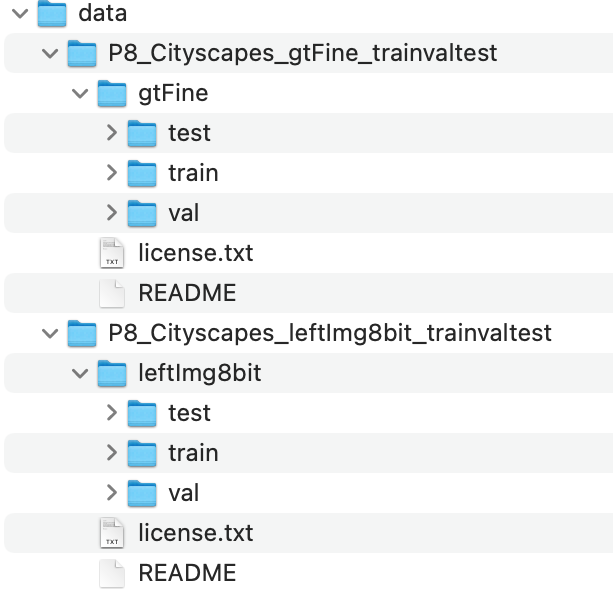
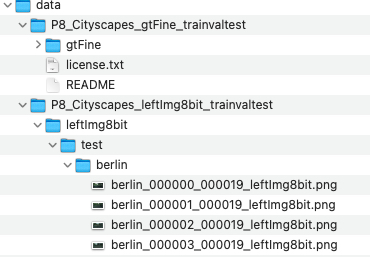
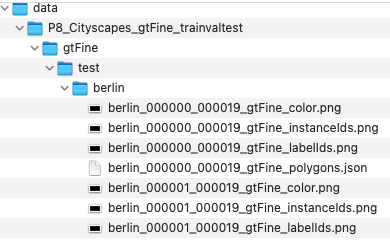

## 2. Exploration des données



In [24]:
img_train_dir = "data_raw/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/train"
mask_train_dir = "data_raw/P8_Cityscapes_gtFine_trainvaltest/gtFine/train"

In [25]:
# vérification des dimensions des images par ville
tailles_par_ville = []
villes = [d for d in os.listdir(img_train_dir) if os.path.isdir(os.path.join(img_train_dir, d))]
for ville in villes:
    ville_path = os.path.join(img_train_dir, ville)
    for img_file in os.listdir(ville_path):
        if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(ville_path, img_file)
            with Image.open(img_path) as img:
                largeur, hauteur = img.size
                tailles_par_ville.append({'ville': ville, 'largeur': largeur, 'hauteur': hauteur})


pd.DataFrame(tailles_par_ville).describe()

,largeur,hauteur
count,2975.0,2975.0
mean,2048.0,1024.0
std,0.0,0.0
min,2048.0,1024.0
25%,2048.0,1024.0
50%,2048.0,1024.0
75%,2048.0,1024.0
max,2048.0,1024.0


* LEs images ont toutes les mêmes dimensions de 1024x2048 pixels. Dans nos futurs développements nous devrons redimensionner les images pour les adapter aux réseaux de neurones et à notre capacité de calcul.
* TARGET_SIZE = (256, 512) (division par 4 des dimensions)

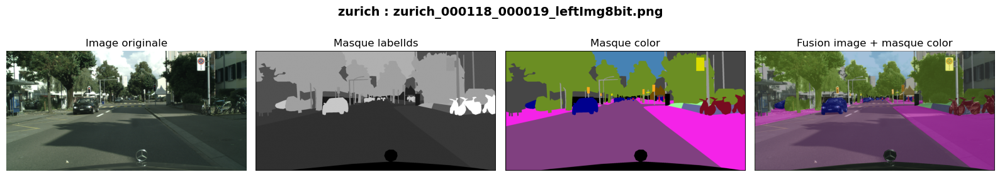

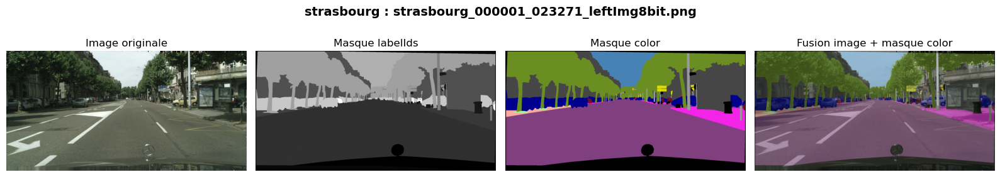

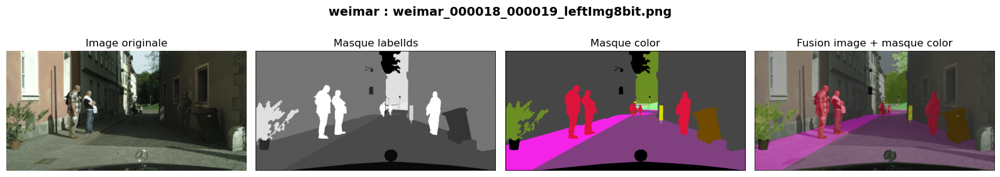

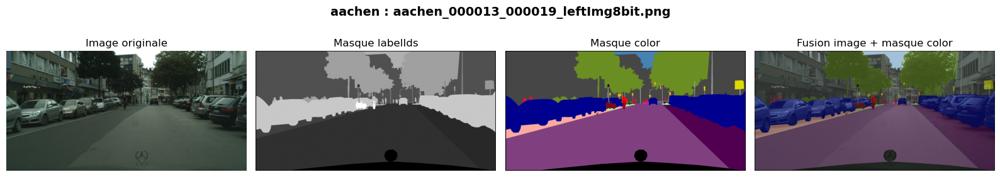

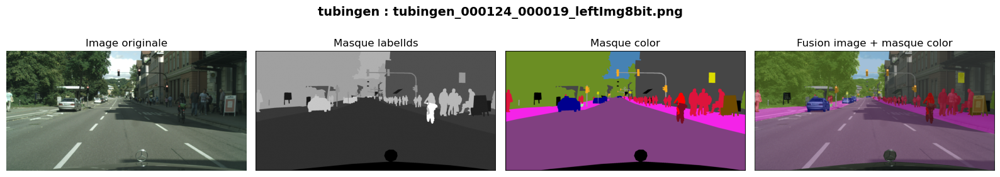

...

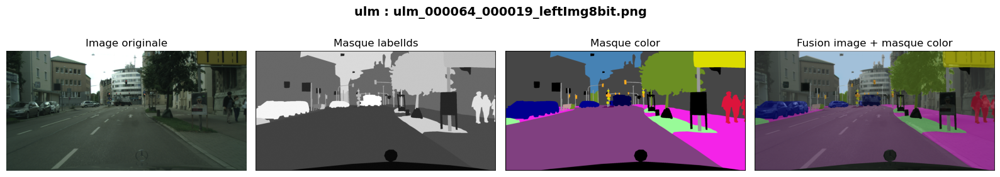

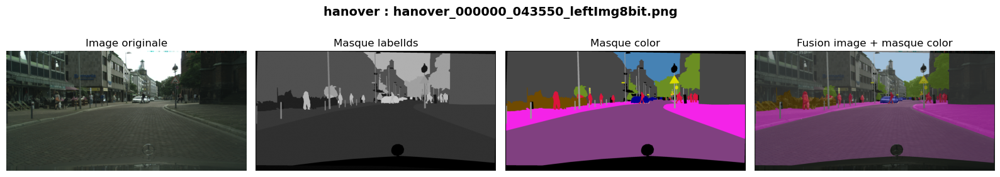

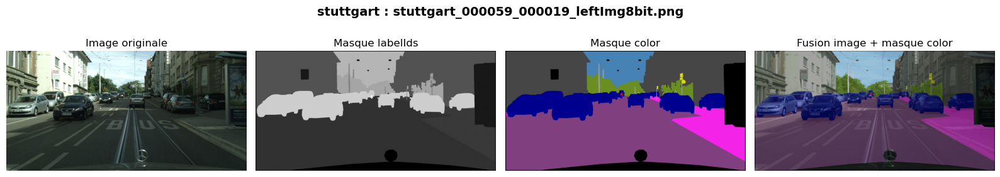

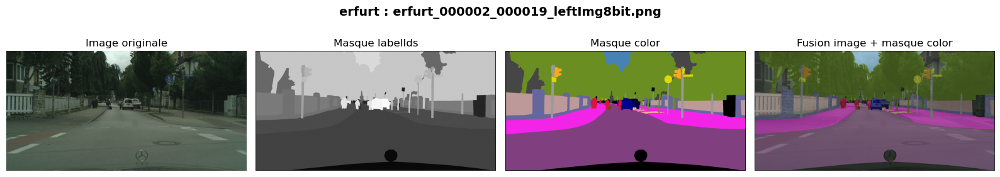

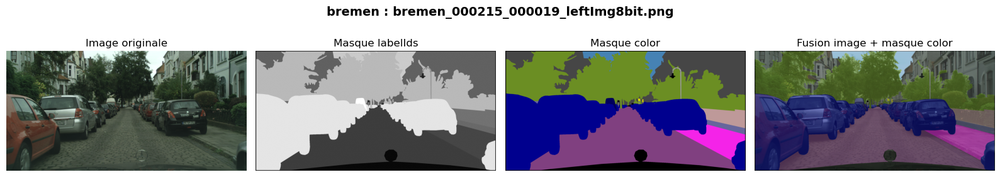

In [29]:
villes = [d for d in os.listdir(img_train_dir) if os.path.isdir(os.path.join(img_train_dir, d))]
for ville in villes:
    ville_img_path = os.path.join(img_train_dir, ville)
    ville_mask_path = os.path.join(mask_train_dir, ville)
    images = [f for f in os.listdir(ville_img_path) if f.lower().endswith(('.png'))]
    if images:
        img_file = random.choice(images)
        img_path = os.path.join(ville_img_path, img_file)
        # Construction des noms de masques à partir du nom de l'image
        base_name = img_file.replace('_leftImg8bit.png', '')
        mask_label_path = os.path.join(ville_mask_path, base_name + '_gtFine_labelIds.png')
        mask_color_path = os.path.join(ville_mask_path, base_name + '_gtFine_color.png')

        img = Image.open(img_path).convert("RGB")
        mask_label = Image.open(mask_label_path).convert("L") if os.path.exists(mask_label_path) else None
        mask_color = Image.open(mask_color_path).convert("RGBA") if os.path.exists(mask_color_path) else None

        # Fusion image originale + masque couleur (avec transparence)
        if mask_color is not None:
            img_rgba = img.convert("RGBA")
            mask_color_np = np.array(mask_color)
            mask_color_np[..., 3] = 128  # alpha semi-transparent
            fusion = Image.alpha_composite(img_rgba, Image.fromarray(mask_color_np))
        else:
            fusion = None

        # Affichage sur une ligne
        fig, axs = plt.subplots(1, 4, figsize=(16, 5))
        axs[0].imshow(img)
        axs[0].set_title("Image originale")
        axs[1].imshow(mask_label, cmap="gray") if mask_label is not None else axs[1].axis('off')
        axs[1].set_title("Masque labelIds")
        axs[2].imshow(mask_color) if mask_color is not None else axs[2].axis('off')
        axs[2].set_title("Masque color")
        axs[3].imshow(fusion) if fusion is not None else axs[3].axis('off')
        axs[3].set_title("Fusion image + masque color")
        for ax in axs:
            ax.axis('off')
        plt.suptitle(f"{ville} : {img_file}", fontsize=14, fontweight='bold', y=0.80)
        plt.tight_layout()
        plt.show()

* Il s'agit bien d'images de circulation citadine, prises depuis l'avant d'une Mercedes. 
* Ce sont des images prises en journée, avec des météos variant de beau temps à couvert.
* En première perspective d'amélioration pour l'avenir, nous pourrions également travailler sur des datasets avec des conditions météo plus variées : 
    - le dataset avec brouillard disponible ici : https://paperswithcode.com/dataset/foggy-cityscapes
    - le dataset avec pluie disponible ici : https://paperswithcode.com/dataset/raincityscapes



## 3. Préparation des dossiers pour les futurs datasets

* **Tout d'abord, nous allons préparer nos futurs dataset de train, val, test comme suit :**
    - on ne reprends pas les données des dossiers de test initiaux, issus des dossiers leftImg8bit et gtFine car ils sont fournis sans leur masques et donc pas exploitables pour nos évaluations futures;
    - on utilisera les dossiers initiaux de validation pour nos futures données de test, les données de validation seront prises sur les données de train;
    - issus du dossier gtFine, on récupère les fichiers _labelIds.png et _color.png pour les masques en niveaux de gris et en couleur pour toutes les classes identifiées; 
    - issus du dossier leftImg8bit, on récupère les fichiers _leftImg8bit.png pour nos images d'origines en RGB;
    - nous ne gardons pas la structure subdivisée par ville des différents sous-dossiers, par soucis de simplification;
    - nous ne gardons pas les fichiers json contenant les coordonnées des polygones car nous allons réduire la taille des images pour notre projet à des fins de réduction de coût, et les coordonnées sont calculées pour des images de dimensions 1024x2048;
    - nous ne gardons pas les fichiers _instanceIds.png qui identifient pour certaines classes (voitures, piétons etc..) les différentes instances de ces classes, car pour notre projet nous nous baserons sur les fichiers _labelIds.png et _color.png qui contiennent toutes les classes détectées sans les séparer par instances.

* **Pour simplifier les manipulations de données, nous avons éxécuté ce qui suit dans notre terminal :**
    - ' find data_raw/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/train -type f -name "*_leftImg8bit.png" -exec cp {} data/train/ \; '
    - ' find data_raw/P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/val -type f -name "*_leftImg8bit.png" -exec cp {} data/test/ \; '
    - ' find data_raw/P8_Cityscapes_gtFine_trainvaltest/gtFine/train -type f \( -name "*_labelIds.png" -o -name "*_color.png" \) -exec cp {} data/train/ \; '
    - ' find data_raw/P8_Cityscapes_gtFine_trainvaltest/gtFine/val -type f \( -name "*_labelIds.png" -o -name "*_color.png" \) -exec cp {} data/test/ \; '

* **à la fin du processus nous obtenons un dossier 'data/train' et un dossier 'data/test' contenant chacun :**
    - les fichiers **_Img8bit.png** pour les images d'origine ;
    - les fichiers **_labelIds.png** et **_color.png** pour les masques.
 
 ![Capture d’écran 2025-06-08 à 18.49.41.png](<attachment:Capture d’écran 2025-06-08 à 18.49.41.png>)
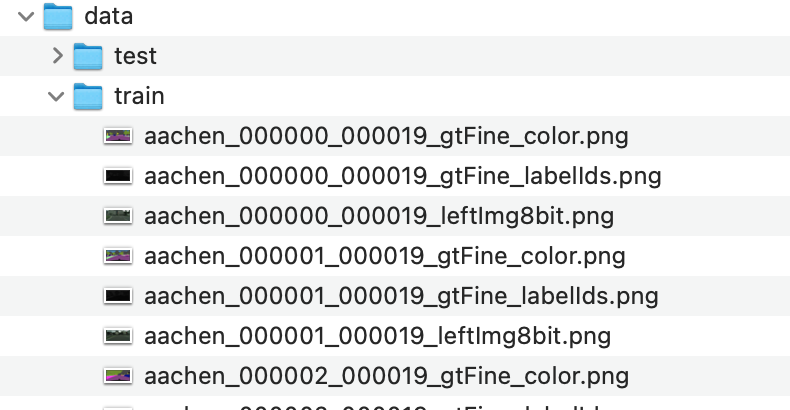

## 4. Simplication des catégories

* Nous avons récupéré un script, issu du dépot git donné en référence, qui permet de créer des namedtuples pour chaque label et ainsi réduire par correspondance le nombre de classes de 34 "labels" à 8 "category".
* les 8 catégories sont : 
    - "void",
    - "flat",
    - "construction",
    - "object",
    - "nature",
    - "sky",
    - "human",
    - "vehicle".

'![list classe.jpg](<attachment:list classe.jpg>)

* on peut observer que certaines catégories, comme "vehicule", ont une composition plus variées de types d'objets que d'autres catégories.
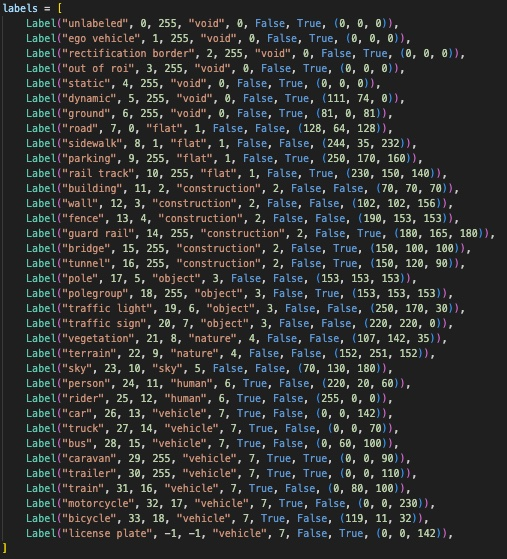

# Chargement des données

* Dans un but de simplification et de maîtrise de nos données, nous allons créer la classe **ImageSegmentationDataset** pour charger les données, y appliquer les transformations et en prévoir les manipulations requises.
* Cette classe hérite de ***tf.keras.utils.PyDataset*** pour optimiser le chargement des données au modèle.
* Elle prend en arguments les chemins des images et des masques, et les charge en mémoire pour les fournir plus tard au modèle.


**Cette classe doit permettre d'effectuer les actions suivantes si nécessaire:**
- Redimensionner les images et les masques en 256x512 
- La conversion du label de chaque image en l'une des 8 catégories mères correspondantes
- Normaliser les images
- Augmentation du jeu de données : appliquer des transformations aléatoires via un pipeline de transformation **Albumentations** (*)
- La possibilité d'ajouter un mask de poids pour les classes déséquilibrées
- La possibilité de mélanger les données à la fin de chaque époch et au début de l'entraînement
- La possibilité de convertir les labels en one-hot encoding
- Visualiser les données


(*) ***choix de la librairie Albumentations pour l’augmentation de données en segmentation d’images :***

- Performance : Albumentations est optimisée pour la vitesse et la gestion efficace de gros volumes d’images, ce qui accélère l’entraînement des modèles.
- Richesse des transformations : Elle propose un large éventail de transformations avancées (géométriques, photométriques, bruit, flou, etc.) adaptées à la segmentation.
- Gestion native des masques : Contrairement à d’autres librairies, Albumentations applique automatiquement les mêmes transformations aux images et aux masques, ce qui est essentiel pour notre projet de segmentation.
- Facilité d’utilisation : L’API est simple, flexible et facilement intégrable dans un pipeline TensorFlow/Keras ou PyTorch.
- Communauté active : Elle est largement utilisée et bien documentée, ce qui facilite le support et l’évolution du projet.
En résumé, Albumentations combine rapidité, diversité des augmentations et gestion fiable des masques, ce qui en fait un choix de référence pour la segmentation d’images.

## tronquer les images au lieu de resize car vérifier si unet a besoin d'une image carrée ou pas pour éviter la déformation des images 
## faire les tests d'affichage (cf p6)

## voir parti pris usagers de la route (piéton et vélos) pour le choix (troncature ou resize)

## visualiser un échantillon d'images : image / masque / image + masque

In [ ]:
import tensorflow as tf
import numpy as np
import albumentations as A
import pathlib
import math
from functools import cached_property
from typing import Optional, Union, Tuple, List, NamedTuple, Any

class ImageSegmentationDataset(tf.keras.utils.PyDataset):
    """
    Générer un dataset adapté à la segmentation d'image.
    """
    # Dimension attendue 
    TARGET_SIZE = (256, 512)

    # Initialisation de l'objet dataset
    def __init__( # déclaration du constructeur
        self, # référence à l'instance de la classe
        paths: List[Tuple[pathlib.Path, pathlib.Path]], # liste de tuples contenant les chemins des images et des masques
        labels: List[NamedTuple], # liste des labels pour la correspondance des catégories
        batch_size: int, # taille des batchs d'images pour chaque itération de l'entraînement
        augmentations: bool = False, # booléen pour l'augmentation des données
        preview: Optional[int] = None, # nombre d'échantillons à prévisualiser (None pour tout charger)
        normalize: Union[bool, str] = True, # booléen pour normalisation des données
        shuffle: bool = True, # booléen pour mélanger les données à chaque époque
        label_onehot: bool = False, # booléen pour la conversion en one_hot encoding des classes
        sample_weights: Optional[List[float]] = None, # poids pour la pondération des classes en cas de déséquilibre
        **kwargs: Any,
    ) -> None:
        super().__init__(**kwargs) # appelle le constructeur de la classe parente

        # load les chemins des images et des masques et applique un aperçu si nécessaire
        self.image_paths, self.mask_paths = self.load_img_and_mask_paths(paths, preview)

        # table de correspondances entre les IDs des labels et les catégorie
        self.table_id2category = {label.id: label.categoryId for label in labels}
        self.table_category2name = {label.categoryId: label.category for label in labels}

        # init les paramètres du dataset
        if not self.image_paths or not self.mask_paths:
            raise ValueError("Image and mask paths cannot be empty.")
        self.batch_size = batch_size
        self.augmentations = augmentations
        self.normalize = normalize
        self.shuffle = shuffle
        self.label_onehot = label_onehot
        self.sample_weights = sample_weights

        # Pipeline d'augmentations si requise
        if self.augmentations:
            # créationd d'un objet 'Compose' issu d’Albumentations pour enchaîner plusieurs transformations.
            self.compose = A.Compose(
                [
                    A.HorizontalFlip(p=0.5), # retournement horizontal avec une probabilité de 50 %
                    #  soit une variation aléatoire de la luminosité/contraste, soit une variation de la teinte/saturation/valeur, avec une probabilité totale de 50 %.
                    # Chaque transformation interne a une probabilité de 100 % d’être appliquée si choisie.
                    A.OneOf(
                        [
                            A.RandomBrightnessContrast(
                                brightness_limit=0.2, contrast_limit=0.2, p=1.0
                            ),
                            A.HueSaturationValue(
                                hue_shift_limit=10,
                                sat_shift_limit=15,
                                val_shift_limit=10,
                                p=1.0,
                            ),
                        ],
                        p=0.5,
                    ),
                    # soit un flou gaussien, soit un flou de mouvement, soit une distorsion optique, avec une probabilité totale de 25 %.
                    # Chaque transformation interne a une probabilité de 100 % d’être appliquée si choisie.
                    A.OneOf(
                        [
                            A.GaussianBlur(blur_limit=3, p=1.0),
                            A.MotionBlur(blur_limit=5, p=1.0),
                            A.OpticalDistortion(distort_limit=0.05, p=1.0),
                        ],
                        p=0.25,
                    ),
                ],
                # si des poids sont utilisés, on indique à Albumentations de traiter sample_weights comme un masque (pour appliquer les mêmes transformations que sur le masque principal).
                additional_targets={"sample_weights": "mask"}
                if self.sample_weights is not None
                else {},
            )

        # mélange les paths des images et des masques si demandé à chaque époch, pour améliorer la généralisation du modèle.
        if self.shuffle:
            self.on_epoch_end()

    @cached_property
    def num_classes(self) -> int:
        """Return the number of unique classes in the dataset."""
        return len(set(self.table_id2category.values()))

    @cached_property
    def num_samples(self) -> int:
        """Return the total number of samples in the dataset."""
        return len(self.image_paths)

    @staticmethod
    def load_img_and_mask_paths(
        paths: List[Tuple[pathlib.Path, pathlib.Path]], preview: Optional[int]
    ) -> Tuple[List[pathlib.Path], List[pathlib.Path]]:
        """Unpack tuples of image and mask paths and apply preview slicing if specified."""
        image_paths, mask_paths = zip(*paths)
        if len(image_paths) != len(mask_paths):
            raise ValueError("Number of images and masks must be equal.")
        if preview is not None:
            image_paths = image_paths[:preview]
            mask_paths = mask_paths[:preview]
        return list(image_paths), list(mask_paths)

    def __len__(self) -> int:
        """Return the number of batches per epoch."""
        length = math.ceil(self.num_samples / self.batch_size)
        return length

    def __getitem__(
        self, index: int
    ) -> Union[
        Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]
    ]:
        """Fetch a batch of images and masks at the given index."""
        start_idx = index * self.batch_size
        end_idx = min(start_idx + self.batch_size, self.num_samples)
        if start_idx >= self.num_samples:
            raise IndexError("Index out of range")

        batch_paths = list(
            zip(self.image_paths[start_idx:end_idx], self.mask_paths[start_idx:end_idx])
        )
        results = [self.load_and_augment(pair) for pair in batch_paths]

        if self.sample_weights is not None:
            images, masks, weights = zip(*results)
            return np.asarray(images), np.asarray(masks), np.asarray(weights)
        else:
            images, masks = zip(*results)
            return np.asarray(images), np.asarray(masks)

    def on_epoch_end(self) -> None:
        """Shuffle the dataset at the end of each epoch if shuffling is enabled."""
        if self.shuffle:
            zip_paths = list(zip(self.image_paths, self.mask_paths))
            np.random.shuffle(zip_paths)
            self.image_paths, self.mask_paths = zip(*zip_paths)

    def preprocess_img(self, img_array: np.ndarray) -> np.ndarray:
        """Apply preprocessing if a valid backbone name is given."""
        if isinstance(self.normalize, bool) and self.normalize:
            return img_array / 255.0
        return img_array

    def load_img_to_array(self, img_path: pathlib.Path) -> np.ndarray:
        """Load an image from disk, resize, and convert it to a numpy array."""
        img = tf.keras.utils.load_img(
            str(img_path),
            target_size=self.TARGET_SIZE,
            color_mode="rgb",
            interpolation="bilinear",
        )
        img_array = tf.keras.utils.img_to_array(img, dtype=np.float32)
        return self.preprocess_img(img_array)

    def load_mask_to_array(self, mask_path: pathlib.Path) -> np.ndarray:
        """Load a mask from disk, resize, map mask ids to category ids, and optionally one-hot encode."""
        mask = tf.keras.utils.load_img(
            str(mask_path),
            target_size=self.TARGET_SIZE,
            color_mode="grayscale",
            interpolation="nearest",
        )
        mask_array = tf.keras.utils.img_to_array(mask, dtype=np.int8)
        mask_array = np.vectorize(self.table_id2category.get)(mask_array).squeeze()
        if self.label_onehot:
            mask_array = tf.keras.utils.to_categorical(
                mask_array, num_classes=self.num_classes
            )
        return mask_array

    def load_and_augment(
        self, paths: Tuple[pathlib.Path, pathlib.Path]
    ) -> Union[
        Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]
    ]:
        """Load image and mask, and apply augmentations then normalization if enabled."""
        img_path, mask_path = paths
        img = self.load_img_to_array(img_path)
        mask = self.load_mask_to_array(mask_path)

        if self.sample_weights is not None:
            weights = np.take(self.sample_weights, mask)
            if self.augmentations:
                augmented = self.compose(image=img, mask=mask, sample_weights=mask)
                return (
                    augmented["image"],
                    augmented["mask"],
                    augmented["sample_weights"],
                )
            else:
                return img, mask, weights
        else:
            if self.augmentations:
                augmented = self.compose(image=img, mask=mask)
                return augmented["image"], augmented["mask"]
            else:
                return img, mask

# *********** sources 

In [ ]:
# Define the class for the dataloader
class ImageSegmentationDataset(tf.keras.utils.PyDataset):
    """
    Dataset generator for image segmentation tasks.
    """
    
    # Dimension attendue 
    TARGET_SIZE = (256, 512)

    def __init__(
        self,
        paths: List[Tuple[pathlib.Path, pathlib.Path]],
        labels: List[NamedTuple],
        batch_size: int,
        target_size: Tuple[int, int],
        augmentations: bool = False,
        preview: Optional[int] = None,
        normalize: Union[bool, str] = True,
        shuffle: bool = True,
        label_onehot: bool = False,
        sample_weights: Optional[List[float]] = None,
        **kwargs: Any,
    ) -> None:
        super().__init__(**kwargs)

        # Load the image and mask paths (apply preview slicing if needed)
        self.image_paths, self.mask_paths = self.load_img_and_mask_paths(paths, preview)

        # Create mapping tables from labels for category conversions
        self.table_id2category = {label.id: label.categoryId for label in labels}
        self.table_category2name = {
            label.categoryId: label.category for label in labels
        }

        # Initialize dataset parameters
        self.batch_size = batch_size
        self.target_size = target_size
        self.augmentations = augmentations
        self.normalize = normalize
        self.shuffle = shuffle
        self.label_onehot = label_onehot
        self.sample_weights = sample_weights

        # Initialize augmentation pipeline if enabled
        if self.augmentations:
            self.compose = A.Compose(
                [
                    A.HorizontalFlip(p=0.5),
                    A.OneOf(
                        [
                            A.RandomBrightnessContrast(
                                brightness_limit=0.2, contrast_limit=0.2, p=1.0
                            ),
                            A.HueSaturationValue(
                                hue_shift_limit=10,
                                sat_shift_limit=15,
                                val_shift_limit=10,
                                p=1.0,
                            ),
                        ],
                        p=0.5,
                    ),
                    A.OneOf(
                        [
                            A.GaussianBlur(blur_limit=3, p=1.0),
                            A.MotionBlur(blur_limit=5, p=1.0),
                            A.OpticalDistortion(distort_limit=0.05, p=1.0),
                        ],
                        p=0.25,
                    ),
                ],
                additional_targets={"sample_weights": "mask"}
                if self.sample_weights is not None
                else {},
            )

        # Shuffle dataset initially if shuffle is enabled.
        if self.shuffle:
            self.on_epoch_end()

    @cached_property
    def num_classes(self) -> int:
        """
        Return the number of unique classes in the dataset.
        """
        return len(set(self.table_id2category.values()))

    @cached_property
    def num_samples(self) -> int:
        """
        Return the total number of samples in the dataset.
        """
        return len(self.image_paths)

    @staticmethod
    def load_img_and_mask_paths(
        paths: List[Tuple[pathlib.Path, pathlib.Path]], preview: Optional[int]
    ) -> Tuple[List[pathlib.Path], List[pathlib.Path]]:
        """
        Unpack tuples of image and mask paths and apply preview slicing if specified.
        """
        image_paths, mask_paths = zip(*paths)
        if len(image_paths) != len(mask_paths):
            raise ValueError("Number of images and masks must be equal.")
        if preview is not None:
            image_paths = image_paths[:preview]
            mask_paths = mask_paths[:preview]
        return list(image_paths), list(mask_paths)

    def __len__(self) -> int:
        """
        Return the number of batches per epoch.
        """
        length = math.ceil(self.num_samples / self.batch_size)
        return length

    def __getitem__(
        self, index: int
    ) -> Union[
        Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]
    ]:
        """
        Fetch a batch of images and masks at the given index.
        """
        start_idx = index * self.batch_size
        end_idx = min(start_idx + self.batch_size, self.num_samples)
        if start_idx >= self.num_samples:
            raise IndexError("Index out of range")

        batch_paths = list(
            zip(self.image_paths[start_idx:end_idx], self.mask_paths[start_idx:end_idx])
        )
        results = [self.load_and_augment(pair) for pair in batch_paths]

        if self.sample_weights is not None:
            images, masks, weights = zip(*results)
            return np.asarray(images), np.asarray(masks), np.asarray(weights)
        else:
            images, masks = zip(*results)
            return np.asarray(images), np.asarray(masks)

    def on_epoch_end(self) -> None:
        """
        Shuffle the dataset at the end of each epoch if shuffling is enabled.
        """
        if self.shuffle:
            zip_paths = list(zip(self.image_paths, self.mask_paths))
            np.random.shuffle(zip_paths)
            self.image_paths, self.mask_paths = zip(*zip_paths)

    def preprocess_img(self, img_array: np.ndarray) -> np.ndarray:
        """
        Apply preprocessing if a valid backbone name is given.
        """
        if isinstance(self.normalize, bool):
            return img_array
        else:
            raise ValueError(
                "Normalization option must be a boolean. String is not implemented here."
            )

    def load_img_to_array(self, img_path: pathlib.Path) -> np.ndarray:
        """
        Load an image from disk, resize, and convert it to a numpy array.
        """
        img = tf.keras.utils.load_img(
            str(img_path),
            target_size=self.target_size,
            color_mode="rgb",
            interpolation="bilinear",
        )
        img_array = tf.keras.utils.img_to_array(img, dtype=np.float32)
        return img_array / 255.0 if self.normalize else img_array

    def load_mask_to_array(self, mask_path: pathlib.Path) -> np.ndarray:
        """
        Load a mask from disk, resize, map mask ids to category ids, and optionally one-hot encode.
        """
        mask = tf.keras.utils.load_img(
            str(mask_path),
            target_size=self.target_size,
            color_mode="grayscale",
            interpolation="nearest",
        )
        mask_array = tf.keras.utils.img_to_array(mask, dtype=np.int8)
        mask_array = np.vectorize(self.table_id2category.get)(mask_array).squeeze()
        if self.label_onehot:
            mask_array = tf.keras.utils.to_categorical(
                mask_array, num_classes=self.num_classes
            )
        return mask_array

    def load_and_augment(
        self, paths: Tuple[pathlib.Path, pathlib.Path]
    ) -> Union[
        Tuple[np.ndarray, np.ndarray], Tuple[np.ndarray, np.ndarray, np.ndarray]
    ]:
        """
        Load image and mask, and apply augmentations then normalization if enabled.
        """
        img_path, mask_path = paths
        img = self.load_img_to_array(img_path)
        mask = self.load_mask_to_array(mask_path)

        if self.sample_weights is not None:
            weights = np.take(self.sample_weights, mask)
            if self.augmentations:
                augmented = self.compose(image=img, mask=mask, sample_weights=mask)
                return (
                    self.preprocess_img(augmented["image"]),
                    augmented["mask"],
                    augmented["sample_weights"],
                )
            else:
                return self.preprocess_img(img), mask, weights
        else:
            if self.augmentations:
                augmented = self.compose(image=img, mask=mask)
                return self.preprocess_img(augmented["image"]), augmented["mask"]
            else:
                return self.preprocess_img(img), mask

    def get_image_and_mask(
        self, index: int
    ) -> Tuple[np.ndarray, np.ndarray, Tuple[pathlib.Path, pathlib.Path]]:
        """
        Retrieve a single image/mask pair for visualization purposes.
        """
        paths = (self.image_paths[index], self.mask_paths[index])
        if self.sample_weights is None:
            img, mask = self.load_and_augment(paths)
        else:
            img, mask, _ = self.load_and_augment(paths)
        return img, mask, paths

    def get_prediction(self, model: Any, index: int) -> np.ndarray:
        """
        Generate a prediction for a given image sample using the provided model.
        """
        img, _, _ = self.get_image_and_mask(index)
        mask_pred = model.predict(np.expand_dims(img, axis=0))
        mask_pred = np.argmax(mask_pred.squeeze(), axis=-1)
        return mask_pred

    def show_transformation(
        self, index: int, figsize: Tuple[int, int] = (12, 8)
    ) -> None:
        """
        Display the original and transformed images and masks for a given sample.
        """
        img, mask, paths = self.get_image_and_mask(index)
        img_path, mask_path = paths

        if self.label_onehot:
            mask = np.argmax(mask, axis=-1)
        if isinstance(self.normalize, str):
            img = (img - img.min()) / (img.max() - img.min())

        fig, ax = plt.subplots(2, 2, figsize=figsize)
        fig.suptitle("Image and Mask before/after Transformation", fontsize=16)
        ax[0, 0].imshow(plt.imread(img_path))
        ax[0, 0].set_title("Original Image")
        ax[0, 1].imshow(img)
        ax[0, 1].set_title("Transformed Image")
        ax[1, 0].imshow(plt.imread(mask_path))
        ax[1, 0].set_title("Original Mask")
        ax[1, 1].imshow(mask)
        ax[1, 1].set_title("Transformed Mask")
        for a in ax.ravel():
            a.axis("off")
        plt.tight_layout()
        plt.show()

    def show_prediction(
        self, model: Any, index: int, figsize: Tuple[int, int] = (15, 6)
    ) -> None:
        """
        Display the original image, ground truth, and model prediction for a sample.
        """
        img, mask, paths = self.get_image_and_mask(index)
        img_path, mask_path = paths
        mask_pred = self.get_prediction(model, index)

        if self.label_onehot:
            mask = np.argmax(mask, axis=-1)
        if isinstance(self.normalize, str):
            img = (img - img.min()) / (img.max() - img.min())

        fig = plt.figure(layout="constrained", figsize=figsize)
        fig.suptitle(f"{model.name} Predictions", fontsize=16)
        subfigs = fig.subfigures(2, 1, wspace=0.07)
        axsTop = subfigs[0].subplots(1, 3, sharey=True, sharex=True)
        axsBottom = subfigs[1].subplots(1, 3, sharey=True, sharex=True)

        for i, ax in enumerate(axsTop):
            if i == 0:
                ax.imshow(self.load_img_to_array(img_path))
                ax.set_title("Original Image")
            elif i == 1:
                ax.imshow(mask, cmap="Greys")
                ax.set_title("Ground Truth Mask (Grayscale)")
            else:
                ax.imshow(mask)
                ax.set_title("Ground Truth Mask (RGB)")
            ax.axis("off")

        for i, ax in enumerate(axsBottom):
            if i == 0:
                ax.imshow(self.load_img_to_array(img_path))
                ax.set_title("Original Image")
            elif i == 1:
                ax.imshow(mask_pred, cmap="Greys")
                ax.set_title("Predicted Mask (Grayscale)")
            else:
                ax.imshow(mask_pred)
                ax.set_title("Predicted Mask (RGB)")
            ax.axis("off")
        plt.show()


NameError: name 'tf' is not defined

**Passons à la préparation des variables pour charger les répertoires d'entraînement (split en train et val) et de test:**

In [ ]:
# Path to the root directory
root_dir = pathlib.Path.cwd().parent
# Path to the train directory
train_dir = root_dir / "data" / "Sorted" / "train"
# Path to the test directory
test_dir = root_dir / "data" / "Sorted" / "test"
# Print the number of files after sorting the files
print(
    "Vérification du nombre de fichiers (comprenant annotations N&B, RGB, polygons, etc...)  dans les répertoires:"
)
print("Train folder files: ", len(os.listdir(train_dir)))
print("Test folder files: ", len(os.listdir(test_dir)))

Vérification du nombre de fichiers (comprenant annotations N&B, RGB, polygons, etc...)  dans les répertoires:
Train folder files:  8925
Test folder files:  1500


In [ ]:
# Get the full train image and masks paths to analyse the classes
image_paths = sorted(list(train_dir.glob("*leftImg8bit.png")))
mask_paths = sorted(list(train_dir.glob("*labelIds.png")))
full_train_paths = list(zip(image_paths, mask_paths))

# Split the full train paths into train and validation sets
image_train, image_val, mask_train, mask_val = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=314
)
train_paths = list(zip(image_train, mask_train))
val_paths = list(zip(image_val, mask_val))

# Finally, get the test image and mask paths
image_paths = sorted(list(test_dir.glob("*leftImg8bit.png")))
mask_paths = sorted(list(test_dir.glob("*labelIds.png")))
test_paths = list(zip(image_paths, mask_paths))

# Print len of train, val and test paths
print(
    "Après séparation des jeux de données en train-val-test, nombre de paires (images RGB, annotations N&B):"
)
print("Train paths: ", len(train_paths))
print("Val paths: ", len(val_paths))
print("Test paths: ", len(test_paths))

Après séparation des jeux de données en train-val-test, nombre de paires (images RGB, annotations N&B):
Train paths:  2380
Val paths:  595
Test paths:  500


A présent, je peux instancier un data generator sur le `full_train_paths` afin d'étudier la répartition des classes sur le jeu d'entraînement:

In [ ]:
# Instantiate the ImageSegmentationDataset for the full_train_paths
full_train_datagen = ImageSegmentationDataset(
    paths=full_train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

Afin d'accélérer le traitement des opérations, je vais utiliser le module `multiprocessing` de Python pour paralléliser le chargement des images et des masques.<br>
En effet, les traitements du data generator en dehors de l'entraînement du modèle ne profitent pas nativement des opérations de parallélisation de Tensorflow.<br>

In [ ]:
def process_item(i):
    _, mask, _ = full_train_datagen.get_image_and_mask(i)
    unique, counts = np.unique(mask, return_counts=True)
    return dict(zip(unique, counts))


# Count the labels in the full train dataset
counter = Counter()
with multiprocessing.Pool(NUM_WORKERS) as pool:
    for result in tqdm(
        pool.imap(
            process_item,
            range(full_train_datagen.num_samples),
        ),
        total=full_train_datagen.num_samples,
    ):
        counter.update(result)

100%|██████████| 2975/2975 [00:18<00:00, 160.03it/s]


In [ ]:
sample_weights = np.array(list(counter.values())) / np.sum(list(counter.values()))
assert np.isclose(np.sum(sample_weights), 1.0)

pixel_distribution = np.round(sample_weights * 100, 2)

ytickslabels = [
    f"{category} ({pct:.2f}%)"
    for category, pct in zip(
        list(full_train_datagen.table_category2name.values()), pixel_distribution
    )
]

In [ ]:
np.sum(list(counter.values())) / 2975

np.float64(131072.0)

In [ ]:
256 * 512 * 16

2097152

In [ ]:
ytickslabels = [
    f"{category} ({pct:.2f}%)"
    for category, pct in zip(
        list(full_train_datagen.table_category2name.values()), pixel_distribution
    )
]

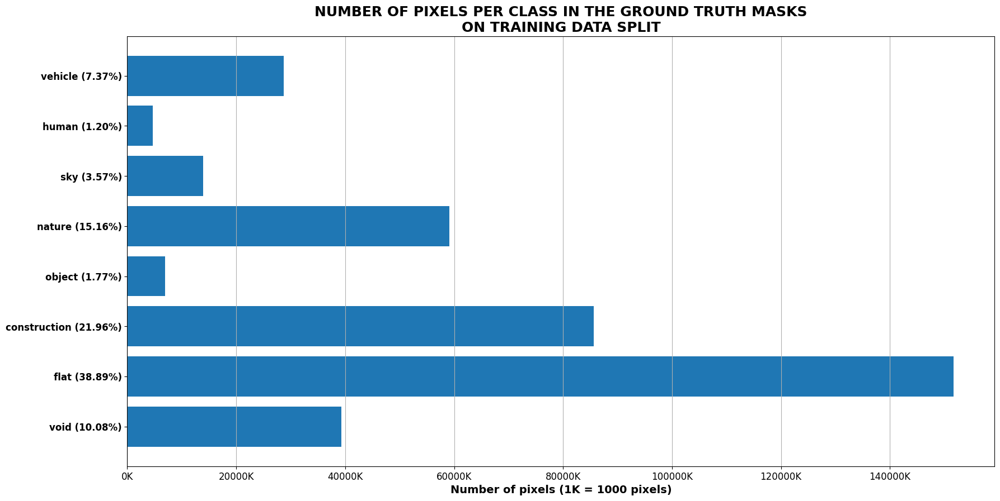

In [ ]:
# Show a plot bar of the number of pixels per class
plt.figure(figsize=(20, 10))
plt.barh(counter.keys(), counter.values())
plt.yticks(
    list(counter.keys()),
    ytickslabels,
    rotation=0,
    fontdict={"fontsize": 12, "fontweight": "bold"},
)
# Convert the x ticks in thousands
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{int(x / 1000)}K"))
plt.gca().xaxis.grid(True)
plt.xlabel(
    "Number of pixels (1K = 1000 pixels)",
    fontdict={"fontsize": 14, "fontweight": "bold"},
)
plt.title(
    "Number of pixels per class in the Ground Truth Masks\non Training data split".upper(),
    fontdict={"fontsize": 18, "fontweight": "bold"},
)
plt.xticks(fontsize=12)
plt.show()

On constate un important déséquilibre entre les classes, ce qui pourrait nuire à l'apprentissage du modèle.<br>
Certaines classes sont très peu représentées à l'image des humains mais aussi des objects, qui risquent aussi d'être des structures relettivement petites.<br>
Je vais donc appliquer un mask de poids pour les classes déséquilibrées que l'on pourra tester pour voir si cela améliore les performances du modèle.<br>

# 3. Les métriques de segmentation
----------------

## 3.1. Présentation des métriques

Afin de mesurer la performance de notre modèle de segmentation, nous allons utiliser les métriques suivantes:
- **La Pixel accuracy** qui est la métrique la plus simple et la plus intuitive. Elle mesure le nombre de pixels correctement prédits par le modèle.
- **La Mean Intersection over Union (mIoU)** qui est une métrique plus complexe qui mesure le chevauchement entre les prédictions et les vraies valeurs. Elle est calculée en prenant le rapport entre l'intersection et l'union des prédictions et des vraies valeurs.
- **La Dice coefficient** qui est une autre métrique, dont l'alias est le F1-score. Elle est calculée en prenant le rapport entre le double de l'intersection et la somme des prédictions et des vraies valeurs.


Je vais créér une classe DiceMetric héritant de `tf.keras.metrics.Metric` pour calculer le Dice coefficient, qui pourra être utilisée dans le modèle avec une fonction de perte personnalisée.<br>


La classe est personnalisée pour prendre une label **sparse**, soit une shape `(batch_size, H, W)` et une sortie produite par le modèle après une activation softmax qui contient un vecteur de probabilités pour chaque pixel et chaque classe sous une forme `(batch_size, H, W, num_classes)`.

In [17]:
@tf.keras.utils.register_keras_serializable(package="custom", name="DiceMetric")
class DiceMetric(tf.keras.metrics.Metric):
    """Custom Dice Coefficient Metric for semantic segmentation.

    This metric computes the mean Dice score over a batch, which is useful for
    evaluating segmentation models. It converts ground truth labels to one-hot
    encoding, computes the Dice coefficient for each class, and then averages
    these scores over the classes.

    Attributes:
        num_classes (int): Number of segmentation classes.
        smooth (float): Smoothing factor to prevent division by zero.
        total_dice (tf.Variable): Accumulator for the sum of Dice scores.
        count (tf.Variable): Accumulator for the count of samples.
    """

    def __init__(
        self,
        num_classes: int = 8,
        smooth: float = 1e-5,
        name: str = "Dice",
        **kwargs: Any,
    ) -> None:
        """Initializes the DiceMetric.

        Args:
            num_classes (int): Number of segmentation classes. Defaults to 8.
            smooth (float): Smoothing factor to avoid division by zero. Defaults to 1e-5.
            name (str): Name of the metric. Defaults to "Dice".
            **kwargs: Additional keyword arguments passed to the base Metric.
        """
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.smooth = smooth
        # Initialize state variables to accumulate dice scores and counts.
        self.total_dice = self.add_weight(name="total_dice", initializer="zeros")
        self.count = self.add_weight(name="count", initializer="zeros")

    def update_state(
        self,
        y_true: tf.Tensor,
        y_pred: tf.Tensor,
        sample_weight: Optional[tf.Tensor] = None,
    ) -> None:
        """Accumulates the Dice score over a batch.

        Converts sparse ground truth labels to one-hot encoding, determines the
        predicted classes from probabilities, calculates the Dice coefficient, and
        updates internal state.

        Args:
            y_true (tf.Tensor): Ground truth tensor (sparse), shape (batch, H, W).
            y_pred (tf.Tensor): Predicted probabilities, shape (batch, H, W, num_classes).
            sample_weight (Optional[tf.Tensor]): Optional sample weights (not used here).
        """
        # Convert ground truth labels to one-hot encoding: shape (batch, H, W, num_classes)
        y_true_onehot = tf.one_hot(y_true, depth=self.num_classes)

        # Obtain predicted class indices from probabilities: shape (batch, H, W)
        y_pred_indices = tf.argmax(y_pred, axis=-1)
        # Convert predicted indices to one-hot encoding: shape (batch, H, W, num_classes)
        y_pred_onehot = tf.one_hot(y_pred_indices, depth=self.num_classes)

        # Flatten one-hot tensors to shape (batch, H*W, num_classes)
        y_true_flat = tf.reshape(
            y_true_onehot, [tf.shape(y_true_onehot)[0], -1, self.num_classes]
        )
        y_pred_flat = tf.reshape(
            y_pred_onehot, [tf.shape(y_pred_onehot)[0], -1, self.num_classes]
        )

        # Compute the intersection and union for each class
        intersection = tf.reduce_sum(
            y_true_flat * y_pred_flat, axis=1
        )  # shape: (batch, num_classes)
        union = tf.reduce_sum(y_true_flat, axis=1) + tf.reduce_sum(
            y_pred_flat, axis=1
        )  # shape: (batch, num_classes)

        # Calculate the Dice coefficient for each class using the smoothing factor
        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)

        # Compute the mean Dice score per image: shape (batch,)
        dice_per_image = tf.reduce_mean(dice, axis=-1)

        # Update the accumulated dice score and count of samples
        self.total_dice.assign_add(tf.reduce_sum(dice_per_image))
        self.count.assign_add(tf.cast(tf.size(dice_per_image), tf.float32))

    def result(self) -> tf.Tensor:
        """Computes and returns the mean Dice score over all accumulated samples.

        Returns:
            tf.Tensor: The mean Dice score.
        """
        return self.total_dice / self.count

    def reset_states(self) -> None:
        """Resets the internal state variables.

        This method is typically called at the start of each epoch.
        """
        self.total_dice.assign(0.0)
        self.count.assign(0.0)

    def get_config(self) -> Dict[str, Any]:
        """Returns the configuration of the metric for serialization.

        Returns:
            dict: Configuration dictionary including 'num_classes' and 'smooth'.
        """
        config = super().get_config()
        config.update(
            {
                "num_classes": self.num_classes,
                "smooth": self.smooth,
            }
        )
        return config

La phase suivante consiste à préparer les métriques générales à suivre notamment avec MeanIoU et la Dice coefficient.<br>

In [18]:
mean_metrics = [
    tf.keras.metrics.MeanIoU(
        num_classes=8,
        name="MeanIoU",
        dtype=None,
        ignore_class=None,  # Add Void if necessary
        sparse_y_true=True,  # As we are using sparse categorical crossentropy, the ground truth is sparse
        sparse_y_pred=False,  # As we are using softmax activation, the output is not sparse
        axis=-1,
    ),
    DiceMetric(num_classes=8, name="Dice"),
    tf.keras.metrics.SparseCategoricalAccuracy(name="Pixel_Accuracy"),
]

2025-03-28 22:25:18.853985: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


**En supplément, je vais aussi suivre l'IoU par classe pour voir comment les modèles sont capables de gérer les déséquilibres de classses:**

In [19]:
per_class_metrics = [
    tf.keras.metrics.IoU(
        num_classes=8,
        target_class_ids=[i],  # Compute the IoU for the background class (class 0)
        name=f"IoU_class_{i}",
        sparse_y_true=True,
        sparse_y_pred=False,
        axis=-1,
    )
    for i in range(8)
]

## 3.2. L'analyse et la visualisation des métriques

Je vais créer une classe `ModelMetric` pour gérer l'analyse et la visualisation des métriques.


Elle permets notamment de:
- Sauvegarder les historiques de métriques d'entraînement et de test par expérience
- Produire des visualisations pour:
    - Analyse de l'évolution de la perte lors de l'entraînement
    - Analyse de l'évolution des métriques lors de l'entraînement
    - Analyse des métriques sur l'évaluation du modèle sur le jeu de test

In [22]:
# Define the Metric class
class ModelMetric:
    """ModelMetric holds and processes training history metrics and evaluation results.

    Attributes:
        history_metrics (Dict[str, Any]): A dictionary of training and validation metrics.
        history_params (Dict[str, Any]): The parameters used during training.
        epochs_list (List[int]): List of epoch numbers.
        results (Dict[str, Any]): Test evaluation results.
        extra_metrics (Dict[str, Any]): Additional information and metrics.
        monitor (str): Metric to monitor, e.g. "loss".
        best_monitor (str): Indicator whether to maximize or minimize the monitor metric ('max' or 'min').
        model_name (str): Name of the model extracted from history.
    """

    def __init__(
        self,
        history: Any,
        results: Dict[str, Any],
        extra_metrics: Dict[str, Any],
        monitor: str,
        best_monitor: str,
    ) -> None:
        """Initialize ModelMetric instance.

        Args:
            history (Any): History object with attributes 'history', 'params', 'epoch', and model information.
            results (Dict[str, Any]): Dictionary containing the test results.
            extra_metrics (Dict[str, Any]): Dictionary of extra metrics and additional info.
            monitor (str): The metric key to monitor (e.g., "loss").
            best_monitor (str): String to indicate direction ('max' or 'min') for the monitor.
        """
        self.history_metrics: Dict[str, Any] = {
            (f"train_{k}" if not k.startswith("val") else k): v
            for k, v in history.history.items()
        }
        self.history_params: Dict[str, Any] = history.params
        self.epochs_list: List[int] = list(map(lambda x: x + 1, history.epoch))
        self.results: Dict[str, Any] = results
        self.extra_metrics: Dict[str, Any] = extra_metrics
        self.monitor: str = monitor
        self.best_monitor: str = best_monitor

        def get_model_name(history_obj: Any) -> str:
            """Extract the model name from the history object.

            Args:
                history_obj (Any): History object to extract the model name from.

            Returns:
                str: Model name.
            """
            if hasattr(history_obj, "model"):
                return history_obj.model.custom_name
            else:
                return history_obj._model.name

        self.model_name: str = get_model_name(history)

    @classmethod
    def from_pickle(cls, pickle_path: str) -> "ModelMetric":
        """Load a ModelMetric instance from a pickle file.

        Args:
            pickle_path (str): Path to the pickle file.

        Returns:
            ModelMetric: The loaded ModelMetric instance.
        """
        with open(pickle_path, "rb") as f:
            return pickle.load(f)

    @property
    def best_epoch(self) -> int:
        """Identify the best epoch based on the monitor.

        Returns:
            int: Index of the epoch with the best monitored metric.

        Raises:
            ValueError: If best_monitor is neither 'max' nor 'min'.
        """
        monitor_values = self.history_metrics[self.monitor]
        match self.best_monitor.lower().strip():
            case "max":
                return monitor_values.index(max(monitor_values))
            case "min":
                return monitor_values.index(min(monitor_values))
            case _:
                raise ValueError(
                    f"Unknown monitor: {self.monitor}. Must be 'max' or 'min'."
                )

    @cached_property
    def metrics_df(self) -> pd.DataFrame:
        """Create a DataFrame containing metrics for the best epoch and additional info.

        Returns:
            pd.DataFrame: Combined DataFrame of training, validation, and test metrics.
        """
        train_val_metrics = (
            pd.DataFrame(self.history_metrics)
            .iloc[self.best_epoch, :]
            .to_frame()
            .T.reset_index(drop=True)
        )
        test_metrics = pd.DataFrame(
            data=[list(self.results.values())],
            columns=[f"test_{k}" for k in self.results.keys()],
        )
        metrics_df = pd.concat([train_val_metrics, test_metrics], axis=1)
        metrics_df = metrics_df.assign(
            best_epoch=self.best_epoch,
            n_epochs=self.history_params.get("epochs"),
            n_steps=self.history_params.get("steps"),
            model_name=self.model_name,
        )
        metrics_df.insert(
            0, "experiment_folder", self.extra_metrics.get("experiment_folder")
        )
        for key, value in self.extra_metrics.items():
            if key != "experiment_folder":
                metrics_df[key] = value
        return metrics_df

    def save_metrics(
        self, metrics_path: str = "../metrics.csv", artifacts_path: str = "../artifacts"
    ) -> None:
        """Save metrics to CSV and serialize the ModelMetric instance as a pickle file.

        Args:
            metrics_path (str): Path to the CSV file where metrics are saved.
            artifacts_path (str): Directory path where artifacts are stored.
        """
        if not os.path.exists(metrics_path):
            self.metrics_df.to_csv(metrics_path, mode="a", header=True, index=False)
            print(f"Metrics file created at {metrics_path}")
        else:
            self.metrics_df[COL_ORDER].to_csv(
                metrics_path, mode="a", header=False, index=False
            )
            print(f"Metrics file updated at {metrics_path}")

        pickle_file_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "model_metric.pkl",
        )
        os.makedirs(os.path.dirname(pickle_file_path), exist_ok=True)
        with open(pickle_file_path, "wb") as f:
            pickle.dump(self, f)
            print(f"Pickle file created at {artifacts_path}")

    def plot_loss(
        self, figsize: tuple = (12, 6), artifacts_path: str = "../artifacts"
    ) -> None:
        """Plot and save the training and validation loss curve.

        Args:
            figsize (tuple): Figure size.
            artifacts_path (str): Directory path where the plot is saved.
        """
        fig_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "plot_loss.png",
        )
        fig = plt.figure(figsize=figsize)
        plt.plot(
            self.epochs_list,
            self.history_metrics["train_loss"],
            label="train_loss",
            color="blue",
        )
        plt.plot(
            self.epochs_list,
            self.history_metrics["val_loss"],
            label="val_loss",
            color="red",
        )
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title(f"{self.model_name} Training and Validation Loss Curve per Epoch")
        plt.grid()
        plt.legend()
        plt.show()
        fig.savefig(fig_path)

    def plot_train_metrics(
        self, figsize: tuple = (20, 10), artifacts_path: str = "../artifacts"
    ) -> None:
        """Plot and save training metrics curves.

        Args:
            figsize (tuple): Figure size.
            artifacts_path (str): Directory path where the plot is saved.
        """
        fig_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "plot_train_metrics.png",
        )
        history_metrics_df = pd.DataFrame(self.history_metrics)
        history_metrics_df.index = self.epochs_list
        fig, ax = plt.subplots(
            2, 2, figsize=figsize, sharex=True, sharey=True, tight_layout=True
        )
        fig.suptitle(f"{self.model_name} Training Metrics Curve per Epoch", fontsize=16)
        for i, split in enumerate(("train", "val")):
            history_metrics_df.filter(regex=rf"{split}_(?!IoU_class|loss|lr)").plot(
                ax=ax[0, i],
                title=f"{split} mean metrics",
                grid=True,
                xlabel="Epochs",
                ylabel="Score",
                legend=True,
            )
        for i, split in enumerate(("train", "val")):
            history_metrics_df.filter(regex=rf"{split}_IoU_(?=class|lr)").plot(
                ax=ax[1, i],
                title=f"{split} per class metrics",
                grid=True,
                xlabel="Epochs",
                ylabel="Score",
                legend=True,
            )
        plt.show()
        fig.savefig(fig_path)

    def plot_test_metrics(
        self, figsize: tuple = (14, 8), artifacts_path: str = "../artifacts"
    ) -> None:
        """Plot and save test metrics split into main metrics and per class metrics.

        The left plot shows main metrics: MeanIoU, Dice, and PixelAccuracy.
        The right plot shows per class metrics.

        Args:
            figsize (tuple): Figure size.
            artifacts_path (str): Directory where the plot is saved.
        """
        fig_path = os.path.join(
            artifacts_path,
            str(self.extra_metrics.get("experiment_folder")),
            "plot_test_metrics.png",
        )
        fig, ax = plt.subplots(1, 2, figsize=figsize)

        # Plot main test metrics: MeanIoU, Dice, PixelAccuracy
        main_metrics_cols = ["test_MeanIoU", "test_Dice", "test_Pixel_Accuracy"]
        main_metrics = self.metrics_df.filter(items=main_metrics_cols).T.sort_values(
            by=0, ascending=True
        )
        main_metrics.plot(
            kind="barh",
            ax=ax[0],
            color="skyblue",
            grid=True,
            legend=False,
            title="Test Main Metrics",
        )

        # Plot per class test metrics: any test_ metric not in the main list or loss/samples
        per_class_metrics = self.metrics_df.filter(
            regex=r"test_(?!MeanIoU|Dice|Pixel_Accuracy|loss|samples)\w+"
        ).T.sort_values(by=0, ascending=True)
        per_class_metrics.plot(
            kind="barh",
            ax=ax[1],
            color="lightgreen",
            grid=True,
            legend=False,
            title="Test Per-Class Metrics",
        )
        for plot in ax:
            plot.set_xticks(np.linspace(0.0, 1.0, 11))
            show_nums_axes(plot, orient="h", fmt=".3f")
            plot.grid(which="both", linestyle="--", linewidth=0.5)
            plot.yaxis.grid(False)

        plt.tight_layout()
        plt.show()
        fig.savefig(fig_path)

# 4. L'architecture UNET
----------------

## 4.1. **Analyse du document : "U-Net: Convolutional Networks for Biomedical Image Segmentation"**

Le document **"U-Net: Convolutional Networks for Biomedical Image Segmentation"** de **Olaf Ronneberger, Philipp Fischer et Thomas Brox** présente une architecture de réseau de neurones convolutifs spécialisée dans la segmentation d'images biomédicales. Cette méthode repose sur une approche en **forme de U**, permettant à la fois l'extraction des caractéristiques contextuelles et une localisation précise.
Il est disponible à l'adresse suivante : https://arxiv.org/abs/1505.04597

---

**Résumé et points clés du document**

**1. Contexte et motivation**
- La segmentation d'images biomédicales est essentielle pour diverses applications (analyse cellulaire, identification de structures neuronales, etc.).
- Les réseaux neuronaux convolutifs (CNN) ont prouvé leur efficacité dans la classification d’images, mais la segmentation requiert une approche différente.
- **Problèmes des approches existantes** :
  - Les réseaux CNN traditionnels traitent les images pixel par pixel (comme le modèle de Ciresan et al.), ce qui est inefficace.
  - Le compromis entre la localisation précise et l'utilisation du contexte reste un défi.

**2. Description de l’architecture U-Net**
- L'architecture est composée de **deux chemins** :
  1. **Chemin contractant (Encoder)** : Extraction des caractéristiques via des convolutions 3x3 suivies de max-pooling.
  2. **Chemin expansif (Decoder)** : Restauration de la résolution de l’image grâce à des opérations d’up-convolution.
- Les connexions **skip connections** permettent de récupérer les détails de l’image tout en maintenant une bonne compréhension du contexte global.
- Le réseau ne contient **aucune couche complètement connectée**, ce qui le rend compatible avec des images de taille variable.

**3. Stratégies d’apprentissage et d’optimisation**
- **Augmentation de données** : Application de transformations élastiques pour compenser le manque d'images annotées.
- **Fonction de coût** : Utilisation d’une fonction d’entropie croisée pondérée pour donner plus d’importance aux frontières entre objets.
- **Stratégie de tuile ("overlap-tile strategy")** : Permet de traiter des images de grande taille sans limitation par la mémoire GPU.

**4. Expérimentations et résultats**
- **Segmentation neuronale en microscopie électronique** : Le modèle U-Net a surpassé l’approche de Ciresan et al. sur la compétition ISBI 2012 avec un "warping error" de 0.0003529.
- **Suivi de cellules en microscopie optique** :
  - **Données PhC-U373** : Intersection-over-Union (IoU) de 92%, meilleure performance comparée au modèle précédent (83%).
  - **Données DIC-HeLa** : IoU de 77.5%, contre 46% pour la meilleure approche concurrente.

**5. Conclusions et impact**
- **Avantages** :
  - L'architecture U-Net est un modèle révolutionnaire qui a ouvert la voie à de nombreuses avancées en vision par ordinateur appliquée au domaine médical.
  - L'accent mis sur **l’augmentation de données** permet un apprentissage efficace même avec un petit jeu de données.
  - Le modèle est **rapide et efficace**, facilitant son adoption dans la communauté scientifique et médicale.
- **Limites et pistes d’amélioration** :
  - L’entraînement du modèle reste coûteux en ressources, nécessitant un GPU performant.
  - Les performances pourraient être améliorées avec des techniques modernes comme l'attention ou des architectures plus récentes (Transformers pour la segmentation).
  - L’U-Net fonctionne très bien sur des images en 2D, mais pour des volumes 3D (IRM, scanner), des variantes comme le **3D U-Net** sont nécessaires.


## 4.2. Implémentation du modèle

In [25]:
def encoder_block(inputs, num_filters):
    # Convolution with 3x3 filter followed by ReLU activation
    x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(inputs)
    x = tf.keras.layers.Activation("relu")(x)

    # Convolution with 3x3 filter followed by ReLU activation
    x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(x)
    x = tf.keras.layers.Activation("relu")(x)

    # Max Pooling with 2x2 filter
    x = tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2)(x)

    return x


def decoder_block(inputs, skip_features, num_filters):
    # Upsampling with 2x2 filter
    x = tf.keras.layers.Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(
        inputs
    )

    # Copy and crop the skip features
    # to match the shape of the upsampled input
    skip_features = ResizeSkipFeatures()([x, skip_features])
    x = tf.keras.layers.Concatenate()([x, skip_features])

    # Convolution with 3x3 filter followed by ReLU activation
    x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(x)
    x = tf.keras.layers.Activation("relu")(x)

    # Convolution with 3x3 filter followed by ReLU activation
    x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(x)
    x = tf.keras.layers.Activation("relu")(x)

    return x


@tf.keras.utils.register_keras_serializable()
class ResizeSkipFeatures(tf.keras.layers.Layer):
    def call(self, inputs):
        x, skip_features = inputs
        return tf.image.resize(skip_features, size=(tf.shape(x)[1], tf.shape(x)[2]))


def unet_model(input_shape=(256, 512, 3), num_classes=8, name="u-net"):
    inputs = tf.keras.layers.Input(input_shape)

    # Contracting Path
    s1 = encoder_block(inputs, 64)
    s2 = encoder_block(s1, 128)
    s3 = encoder_block(s2, 256)
    s4 = encoder_block(s3, 512)

    # Bottleneck
    b1 = tf.keras.layers.Conv2D(1024, 3, padding="same")(s4)
    b1 = tf.keras.layers.Activation("relu")(b1)
    b1 = tf.keras.layers.Conv2D(1024, 3, padding="same")(b1)
    b1 = tf.keras.layers.Activation("relu")(b1)

    # Expansive Path
    s5 = decoder_block(b1, s4, 512)
    s6 = decoder_block(s5, s3, 256)
    s7 = decoder_block(s6, s2, 128)
    s8 = decoder_block(s7, s1, 64)

    # Output
    outputs = tf.keras.layers.Conv2D(
        num_classes, 1, padding="same", activation="softmax"
    )(s8)

    model = tf.keras.models.Model(inputs=inputs, outputs=outputs, name=name)
    return model

Regardons la structure de l'architecture U-Net que j'ai implémenté en voyant notamment la concaténation des couches de l'encodeur et du décodeur.<br>

**Phase de contraction**<br>
La structure suit une première phase d'augmentation du Receptive Field avec des convolutions 3x3 et un max pooling 2x2 pour capturer les caractéristiques de l'image à grande échelle.<br>

**Phase d'expansion**<br>
La phase de contraction est suivie d'une phase d'expansion avec des convolutions 3x3 et un upsampling 2x2 pour restaurer la résolution de l'image tout en préservant les détails.<br>
La concaténation des couches de l'encodeur et du décodeur permet de combiner les informations contextuelles et locales pour une segmentation plus précise et diminuer la perte d'information lors de l'upsampling.<br>

**Sortie du modèle**<br>
La sortie du modèle est une image de la même taille que l'image d'entrée, avec un vecteur de probabilités pour chaque pixel et chaque classe.<br>

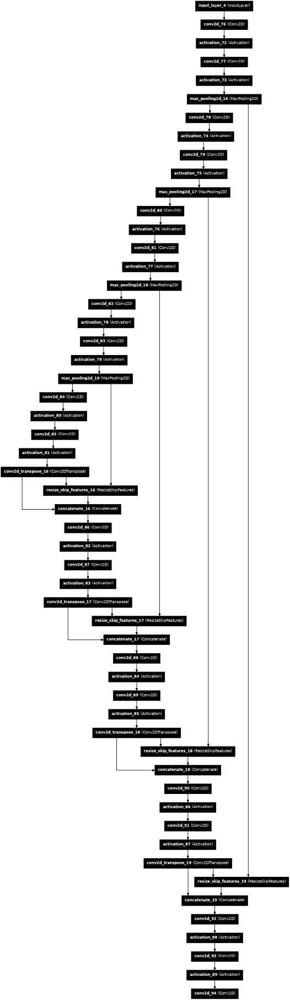

In [30]:
tf.keras.utils.plot_model(
    unet_model(),
    "unet_model.png",
    show_shapes=False,
    show_layer_names=True,
    rankdir="TB",  # Changed orientation to Top-Bottom for increased height
    expand_nested=False,
    dpi=30,
)


Regardons à présent le nombre de paramètres entraînables et non entraînables du modèle.<br>

In [82]:
print("Using segmentation model: U-Net custom implementation")
# Compute the number of trainable parameters
trainable_count = np.sum(
    [tf.keras.backend.count_params(w) for w in unet_model().trainable_weights]
)
non_trainable_count = np.sum(
    [tf.keras.backend.count_params(w) for w in unet_model().non_trainable_weights]
)
print("===========================")
print(f"Trainable parameters: {trainable_count}")
print(f"Non-trainable parameters: {non_trainable_count}")

Using segmentation model: U-Net custom implementation
Trainable parameters: 31032200
Non-trainable parameters: 0.0


# 5. Phase de modélisation
----------------

Dans le cadre de cette première phase de modélisation, nous conserverons le modèle vierge d'U-NET.<br>
Nous

## Evaluation des différents fonctions de perte
Afin de regarder comment le modèle se comporter face au déséquilibre des classes, nous testerons dans cette phase les différentes fonctions de pertes dont:
- 1. **Sparce Categorical Cross Entropy (SCCE)** : La fonction de perte la plus utilisée pour les problèmes de classification multi-classes.
- 2. **SCCE with weights** : La même fonction de perte mais avec des poids pour les classes déséquilibrées.
- 3. **Combinaison de DiceLoss et SCCE** : La DiceLoss est une fonction de perte qui mesure la similarité entre deux ensembles. Seule, elle peut être sensible aux classes déséquilibrées, mais combinée avec la SCCE, elle peut aider à améliorer la performance du modèle.
- 4. **Combinaison de FolcalLoss et Dice** : La FocalLoss est une fonction de perte qui met l'accent sur les exemples difficiles à classer. Seule, elle peut être sensible aux classes déséquilibrées, mais combinée avec la SCCE, elle peut aider à améliorer la performance du modèle.

## Evaluation de l'ajout d'augmentation des données
Je vais tester l'impact de l'augmentation des données sur le modèle en ajoutant des transformations aléatoires sur les images et les masques.<br>
Je vais utiliser le module `albumentations` pour appliquer des transformations aléatoires sur les images et les masques.<br>
- 5. Reprise de la meilleur fonction de perte sur le jeu de données et ajout d'augmentation des données

## Définition des fonctions de perte

In [35]:
class DiceLoss(tf.keras.losses.Loss):
    def __init__(self, num_classes, from_logits=False, smooth=1e-6, name="dice_loss"):
        """
        Dice Loss pour segmentation multi-classe.

        Args:
            num_classes (int): Nombre de classes dans la segmentation.
            from_logits (bool): Si True, applique `softmax` avant le calcul.
            smooth (float): Facteur de lissage pour éviter la division par zéro.
            name (str): Nom de la loss.
        """
        super().__init__(name=name)
        self.num_classes = num_classes
        self.from_logits = from_logits
        self.smooth = smooth

    def call(self, y_true, y_pred):
        """
        Calcul de la perte Dice.

        Args:
            y_true (tensor): Vraies étiquettes (batch, H, W) ou (batch, H, W, C).
            y_pred (tensor): Prédictions (batch, H, W, C).

        Returns:
            Tensor: Dice Loss
        """
        # Convertir y_true en one-hot si nécessaire
        if tf.shape(y_true).shape == 3:  # (batch, H, W) → (batch, H, W, C)
            y_true = tf.one_hot(tf.cast(y_true, tf.int32), depth=self.num_classes)

        if self.from_logits:
            y_pred = tf.nn.softmax(
                y_pred, axis=-1
            )  # Conversion des logits en probabilités

        # Calcul de l'intersection et de l'union pour chaque classe
        intersection = tf.reduce_sum(y_true * y_pred, axis=[1, 2])
        union = tf.reduce_sum(y_true, axis=[1, 2]) + tf.reduce_sum(y_pred, axis=[1, 2])

        dice_score = (2.0 * intersection + self.smooth) / (union + self.smooth)

        # Moyenne sur toutes les classes
        return 1 - tf.reduce_mean(dice_score, axis=-1)


In [36]:
@tf.keras.utils.register_keras_serializable(
    package="custom", name="DiceCrossEntropyLoss"
)
class DiceCrossEntropyLoss(tf.keras.losses.Loss):
    """Loss function combining Dice loss and Sparse Categorical Crossentropy.

    This loss function computes a weighted sum of the Dice loss and the sparse
    categorical crossentropy loss. The Dice loss is useful for segmentation tasks,
    while the sparse categorical crossentropy loss measures pixel-wise error.

    Attributes:
        num_classes (int): Number of segmentation classes.
        from_logits (bool): Whether predictions are logits. If True, applies softmax.
        smooth (float): Smoothing constant to avoid division by zero.
        alpha (float): Weight for the Dice loss component in the overall loss.
    """

    def __init__(
        self,
        num_classes: int = 8,
        from_logits: bool = False,
        smooth: float = 1e-6,
        alpha: float = 0.7,
        name: str = "dice_crossentropy_loss",
        **kwargs: Any,
    ) -> None:
        """Initializes the DiceCrossEntropyLoss.

        Args:
            num_classes (int): Number of segmentation classes. Defaults to 8.
            from_logits (bool): Indicates if y_pred is a logits tensor. Defaults to False.
            smooth (float): Smoothing factor to prevent division by zero. Defaults to 1e-6.
            alpha (float): Weighting factor for the Dice loss. Ranges from 0 to 1. Defaults to 0.7.
            name (str): Name of the loss function. Defaults to "dice_crossentropy_loss".
            **kwargs: Additional keyword arguments.
        """
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.from_logits = from_logits
        self.smooth = smooth
        self.alpha = alpha

    def call(self, y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        """Computes the weighted sum of Dice loss and Sparse Categorical Crossentropy loss.

        Args:
            y_true (tf.Tensor): Ground truth labels.
            y_pred (tf.Tensor): Predicted probabilities or logits.

        Returns:
            tf.Tensor: The computed combined loss.
        """
        # Compute the Dice loss using the predefined DiceLoss function.
        dice_loss = DiceLoss(
            num_classes=self.num_classes,
            from_logits=self.from_logits,
            smooth=self.smooth,
        )(y_true, y_pred)

        # Compute the Sparse Categorical Crossentropy loss.
        scce_loss = tf.keras.losses.SparseCategoricalCrossentropy(
            from_logits=self.from_logits
        )(y_true, y_pred)

        # Return the weighted sum of the Dice loss and crossentropy loss.
        return self.alpha * dice_loss + (1 - self.alpha) * scce_loss

    def get_config(self) -> Dict[str, Any]:
        """Returns the configuration dictionary for serialization.

        Returns:
            Dict[str, Any]: A dictionary containing the configuration of this loss.
        """
        config = super().get_config()
        config.update(
            {
                "num_classes": self.num_classes,
                "from_logits": self.from_logits,
                "smooth": self.smooth,
                "alpha": self.alpha,
            }
        )
        return config

In [37]:
@tf.keras.utils.register_keras_serializable(package="custom", name="DiceFocalLoss")
class DiceFocalLoss(tf.keras.losses.Loss):
    """Loss function combining Dice loss and Focal loss.

    This loss function computes a weighted sum of Dice Loss and Sparse Categorical Focal Loss.
    It is designed for multiclass segmentation tasks.

    Attributes:
        num_classes (int): Number of classes.
        from_logits (bool): Whether predictions are logits.
        smooth (float): Smoothing factor for Dice Loss.
        alpha (float): Weight for Dice loss in the weighted sum.
        gamma (float): Focusing parameter for Focal loss.
    """

    def __init__(
        self,
        num_classes: int = 8,
        from_logits: bool = False,
        smooth: float = 1e-6,
        alpha: float = 0.7,
        gamma: float = 2.0,
        name: str = "dice_focal_loss",
        **kwargs: any,
    ) -> None:
        """Initializes the DiceFocalLoss.

        Args:
            num_classes (int, optional): Number of segmentation classes. Defaults to 8.
            from_logits (bool, optional): If True, apply softmax before loss computation.
                Defaults to False.
            smooth (float, optional): Smoothing constant to avoid division by zero in Dice loss.
                Defaults to 1e-6.
            alpha (float, optional): Weighting factor for the Dice loss component.
                Defaults to 0.7.
            gamma (float, optional): Focusing parameter for the Focal loss.
                Defaults to 2.0.
            name (str, optional): Name of the loss function. Defaults to "dice_focal_loss".
            **kwargs: Additional keyword arguments.
        """
        super().__init__(name=name, **kwargs)
        self.num_classes: int = num_classes
        self.from_logits: bool = from_logits
        self.smooth: float = smooth
        self.alpha: float = alpha
        self.gamma: float = gamma

    def call(self, y_true: tf.Tensor, y_pred: tf.Tensor) -> tf.Tensor:
        """Calculates the combined Dice and Focal loss.

        Args:
            y_true (tf.Tensor): Ground truth labels.
            y_pred (tf.Tensor): Predicted output tensor.

        Returns:
            tf.Tensor: Weighted sum of Dice Loss and Focal Loss.
        """
        # Compute Dice Loss using a predefined DiceLoss function
        dice_loss = DiceLoss(
            num_classes=self.num_classes,
            from_logits=self.from_logits,
            smooth=self.smooth,
        )(y_true, y_pred)

        # Compute Focal Loss using SparseCategoricalFocalLoss
        focal_loss = SparseCategoricalFocalLoss(
            gamma=self.gamma,
            from_logits=self.from_logits,
            name="sparse_categorical_focal_loss",
        )(y_true, y_pred)

        # Return the weighted sum: alpha * Dice Loss + (1 - alpha) * Focal Loss
        return self.alpha * dice_loss + (1 - self.alpha) * focal_loss

    def get_config(self) -> dict:
        """Returns the configuration of the loss function.

        This is used for serializing the loss function.

        Returns:
            dict: Configuration dictionary of the DiceFocalLoss.
        """
        config = super().get_config()
        config.update(
            {
                "num_classes": self.num_classes,
                "from_logits": self.from_logits,
                "smooth": self.smooth,
                "alpha": self.alpha,
                "gamma": self.gamma,
            }
        )
        return config

## 50. SCCE Loss

In [38]:
train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

In [23]:
# Create the model
model = unet_model(input_shape=(256, 512, 3), num_classes=train_datagen.num_classes)

# Folder to create to store artifacts
new_folder = 50

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Define the loss function
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=False,  # Set to False if y_pred is a probability distribution
    name="sparse_categorical_crossentropy",
)

# Define the optimizer
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4)

# Compile the model
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
    # weighted_metrics=None,
    # steps_per_execution=1,
    # loss_weights=None,
)

# Train the model
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=25,
    callbacks=[checkpoint_callback, early_stopping],
)

Epoch 1/25


2025-02-21 20:49:31.877319: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 67108864 exceeds 10% of free system memory.
2025-02-21 20:49:31.877373: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 536870912 exceeds 10% of free system memory.
2025-02-21 20:49:31.970490: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 536870912 exceeds 10% of free system memory.
2025-02-21 20:49:32.225532: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 134217728 exceeds 10% of free system memory.
2025-02-21 20:49:32.263324: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 268435456 exceeds 10% of free system memory.


149/149 ━━━━━━━━━━━━━━━━━━━━ 3779s 25s/step - Dice: 0.1342 - IoU_class_0: 0.0569 - IoU_class_1: 0.4131 - IoU_class_2: 0.1142 - IoU_class_3: 1.6580e-04 - IoU_class_4: 0.0166 - IoU_class_5: 0.0073 - IoU_class_6: 0.0000e+00 - IoU_class_7: 1.8124e-06 - MeanIoU: 0.0760 - Pixel_Accuracy: 0.4067 - loss: 1.7305 - val_Dice: 0.3779 - val_IoU_class_0: 0.4105 - val_IoU_class_1: 0.7974 - val_IoU_class_2: 0.2789 - val_IoU_class_3: 0.0000e+00 - val_IoU_class_4: 0.3891 - val_IoU_class_5: 0.5172 - val_IoU_class_6: 0.0000e+00 - val_IoU_class_7: 0.0076 - val_MeanIoU: 0.3001 - val_Pixel_Accuracy: 0.6477 - val_loss: 0.9344
Epoch 2/25
149/149 ━━━━━━━━━━━━━━━━━━━━ 3735s 25s/step - Dice: 0.4337 - IoU_class_0: 0.4400 - IoU_class_1: 0.7989 - IoU_class_2: 0.4256 - IoU_class_3: 0.0000e+00 - IoU_class_4: 0.4207 - IoU_class_5: 0.6205 - IoU_class_6: 0.0000e+00 - IoU_class_7: 0.1109 - MeanIoU: 0.3521 - Pixel_Accuracy: 0.6936 - loss: 0.8483 - val_Dice: 0.5088 - val_IoU_class_0: 0.4403 - val_IoU_class_1: 0.8262 - val_I

In [24]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights("../artifacts/50/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

32/32 ━━━━━━━━━━━━━━━━━━━━ 184s 6s/step - Dice: 0.6785 - IoU_class_0: 0.6708 - IoU_class_1: 0.9134 - IoU_class_2: 0.7211 - IoU_class_3: 0.1715 - IoU_class_4: 0.8002 - IoU_class_5: 0.8334 - IoU_class_6: 0.3372 - IoU_class_7: 0.6914 - MeanIoU: 0.6424 - Pixel_Accuracy: 0.8729 - loss: 0.4349
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 702ms/step
Inference time on a unique prediction: 0.95 seconds


In [39]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/50/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/50/best_model.keras",
        custom_objects={
            "ResizeSkipFeatures": ResizeSkipFeatures,
            "DiceMetric": DiceMetric,
            # "DiceLoss": DiceLoss,
            # "DiceCrossEntropyLoss": DiceCrossEntropyLoss,
            # "DiceFocalLoss": DiceFocalLoss,
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.learning_rate.value.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

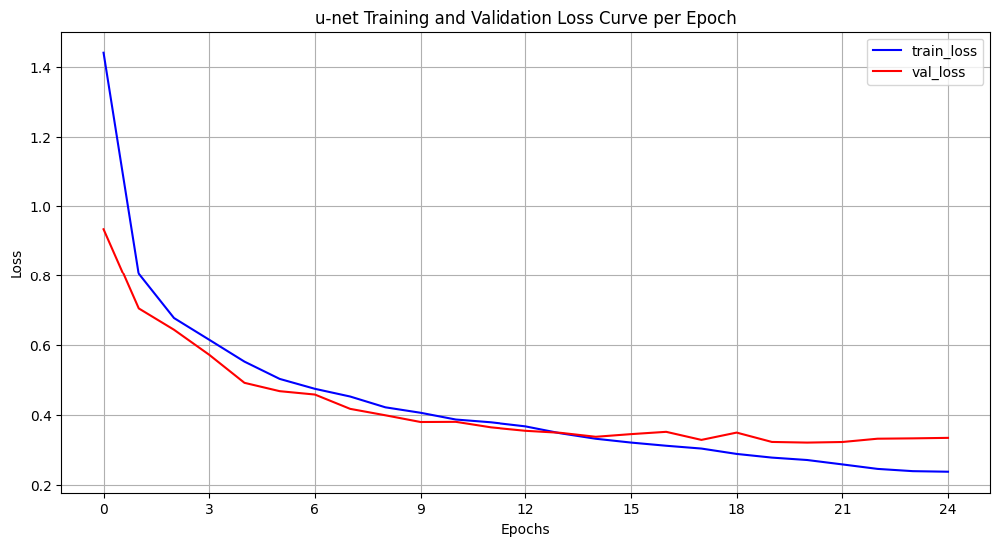

Best epoch:  24
Best Validation Loss:  0.334


In [40]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

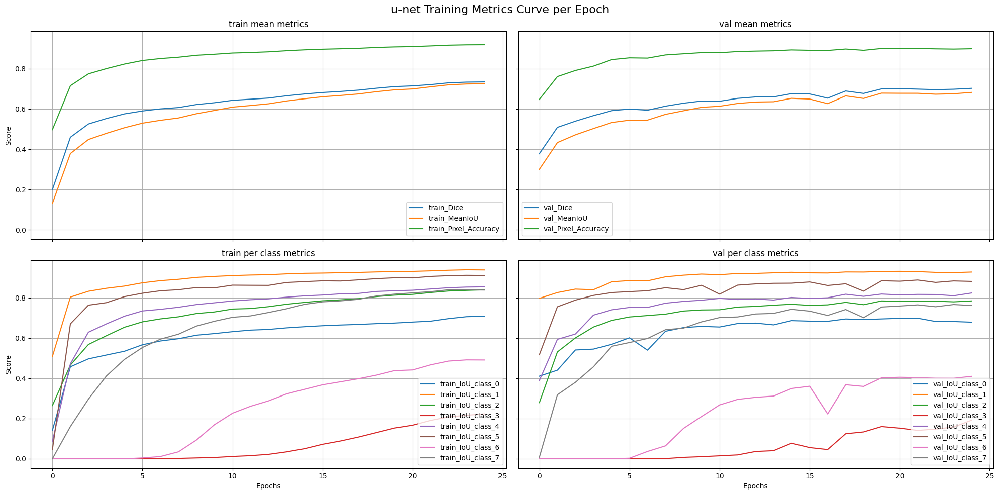

Best Validation MeanIoU:  0.6826
Best Validation Pixel Accuracy:  0.8996
Best Validation Dice:  0.7029


In [41]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

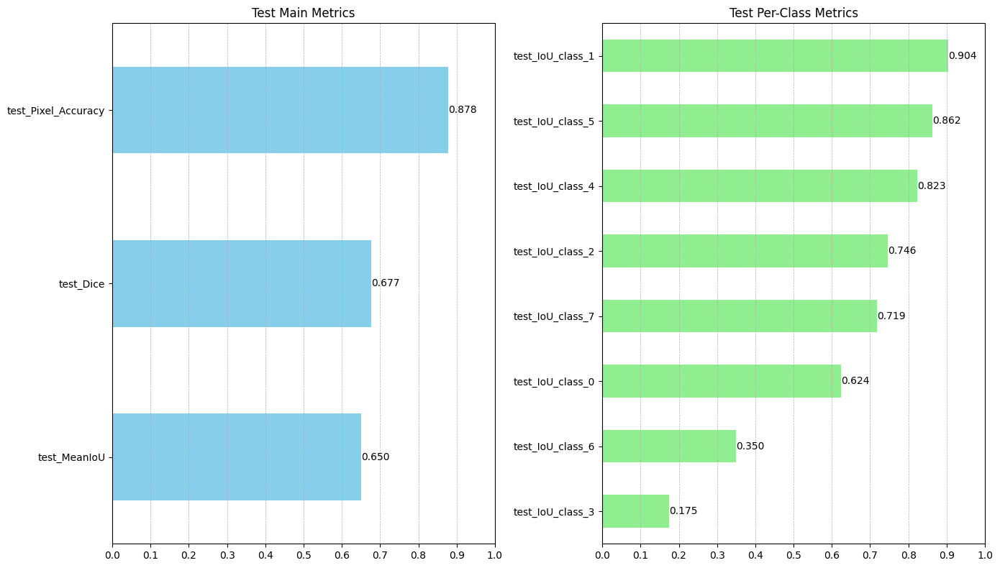

In [42]:
model_metric.plot_test_metrics()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


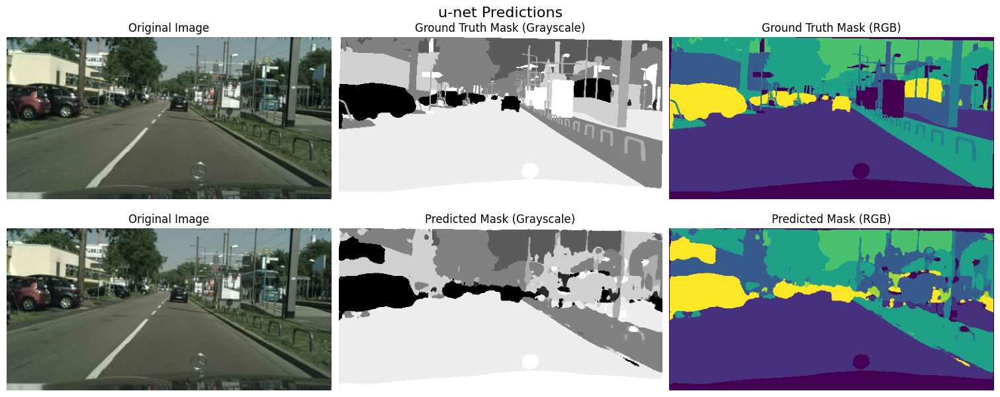

In [44]:
test_datagen.show_prediction(model=model, index=11)

In [45]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


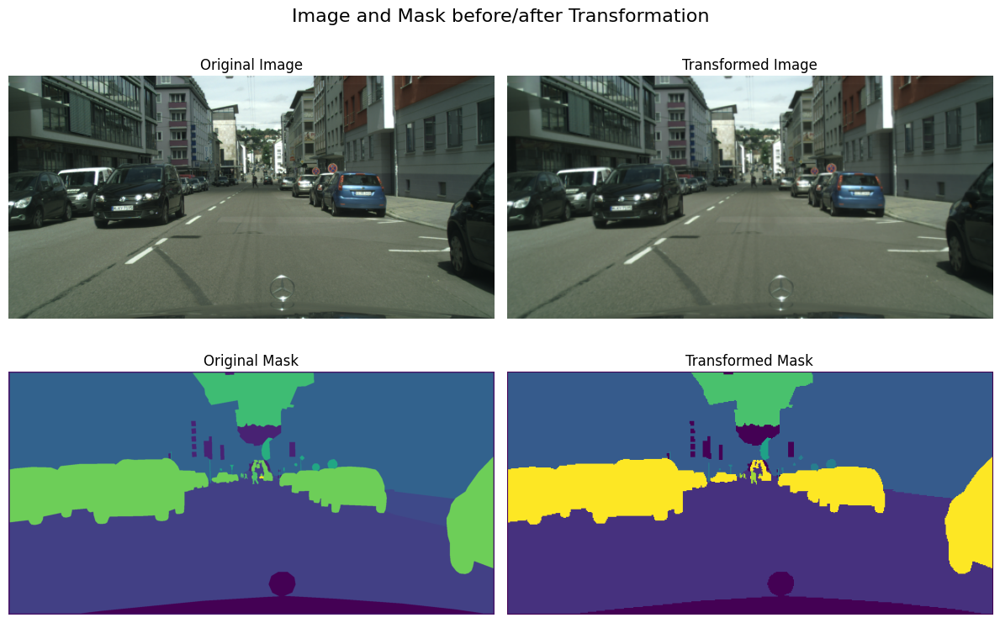

In [46]:
train_datagen.show_transformation(index=5)

## 51. SCCE Loss weighted

In [47]:
# Compute the sample weights
count = [39301283, 151642107, 85648305, 6898389, 59102656, 13912632, 4679976, 28753852]
pix_per_img = 256 * 512
assert np.isclose(np.sum(count) / pix_per_img, 2975.0)
weights = sum(count) / (8 * np.array(count))
sample_weights = weights / np.sum(weights)
assert np.isclose(np.sum(sample_weights), 1)

# Create the train, val, and test datagens with sample weights
train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=True,
    sample_weights=sample_weights,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

In [27]:
# Create the model
model = unet_model(input_shape=(256, 512, 3), num_classes=train_datagen.num_classes)

# Folder to create to store artifacts
new_folder = 51

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Define the loss function
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=False,  # Set to False if y_pred is a probability distribution
    name="sparse_categorical_crossentropy",
)

# Define the optimizer
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4)

# Compile the model
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
    # weighted_metrics=None,
    # steps_per_execution=1,
    # loss_weights=None,
)

# Train the model
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    callbacks=[checkpoint_callback, early_stopping],
)

Epoch 1/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3661s 25s/step - Dice: 0.2902 - IoU_class_0: 0.2761 - IoU_class_1: 0.3901 - IoU_class_2: 0.2935 - IoU_class_3: 0.0606 - IoU_class_4: 0.3344 - IoU_class_5: 0.1136 - IoU_class_6: 0.1106 - IoU_class_7: 0.2780 - MeanIoU: 0.2321 - Pixel_Accuracy: 0.4005 - loss: 0.0779 - val_Dice: 0.2730 - val_IoU_class_0: 0.1874 - val_IoU_class_1: 0.4792 - val_IoU_class_2: 0.0190 - val_IoU_class_3: 0.0126 - val_IoU_class_4: 0.3764 - val_IoU_class_5: 0.6607 - val_IoU_class_6: 0.0163 - val_IoU_class_7: 1.7528e-06 - val_MeanIoU: 0.2189 - val_Pixel_Accuracy: 0.4062 - val_loss: 1.8407
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3700s 25s/step - Dice: 0.3128 - IoU_class_0: 0.2835 - IoU_class_1: 0.5663 - IoU_class_2: 0.0873 - IoU_class_3: 0.0317 - IoU_class_4: 0.3854 - IoU_class_5: 0.5186 - IoU_class_6: 0.0294 - IoU_class_7: 0.0959 - MeanIoU: 0.2498 - Pixel_Accuracy: 0.4704 - loss: 0.0584 - val_Dice: 0.4811 - val_IoU_class_0: 0.4791 - val_IoU_class_1: 0.7543 - val_IoU_class_2: 0

In [28]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights("../artifacts/51/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

32/32 ━━━━━━━━━━━━━━━━━━━━ 184s 6s/step - Dice: 0.6660 - IoU_class_0: 0.6574 - IoU_class_1: 0.8875 - IoU_class_2: 0.6814 - IoU_class_3: 0.2094 - IoU_class_4: 0.7695 - IoU_class_5: 0.8129 - IoU_class_6: 0.3243 - IoU_class_7: 0.6153 - MeanIoU: 0.6197 - Pixel_Accuracy: 0.8416 - loss: 0.4961
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 654ms/step
Inference time on a unique prediction: 0.80 seconds


In [48]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/51/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/51/best_model.keras",
        custom_objects={
            "ResizeSkipFeatures": ResizeSkipFeatures,
            "DiceMetric": DiceMetric,
            # "DiceLoss": DiceLoss,
            # "DiceCrossEntropyLoss": DiceCrossEntropyLoss,
            # "DiceFocalLoss": DiceFocalLoss,
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.learning_rate.value.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

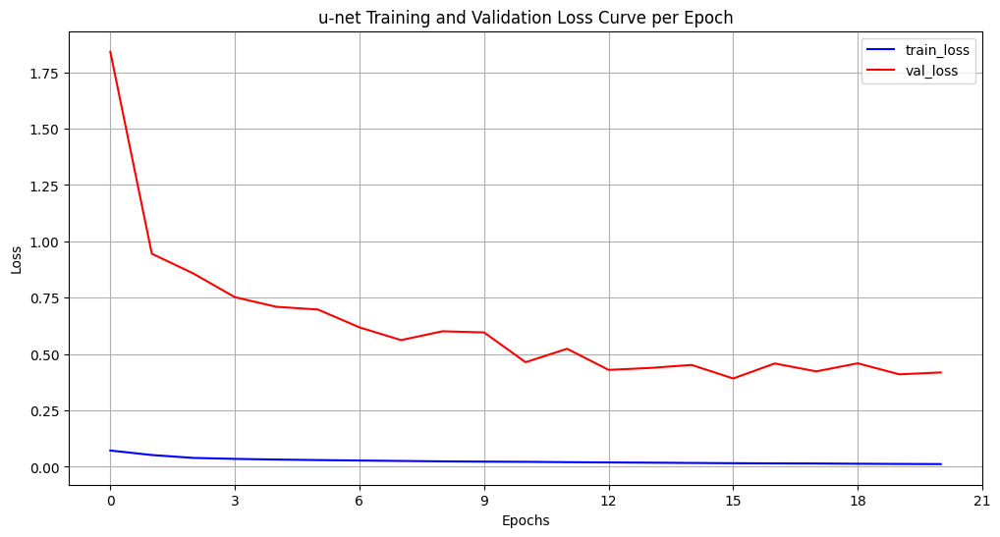

Best epoch:  15
Best Validation Loss:  0.3916


In [49]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

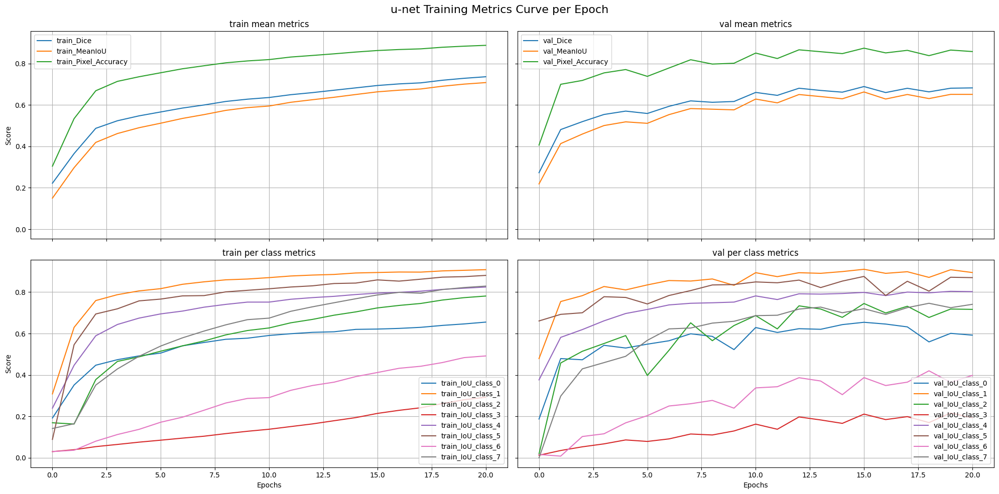

Best Validation MeanIoU:  0.6626
Best Validation Pixel Accuracy:  0.8739
Best Validation Dice:  0.6887


In [50]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

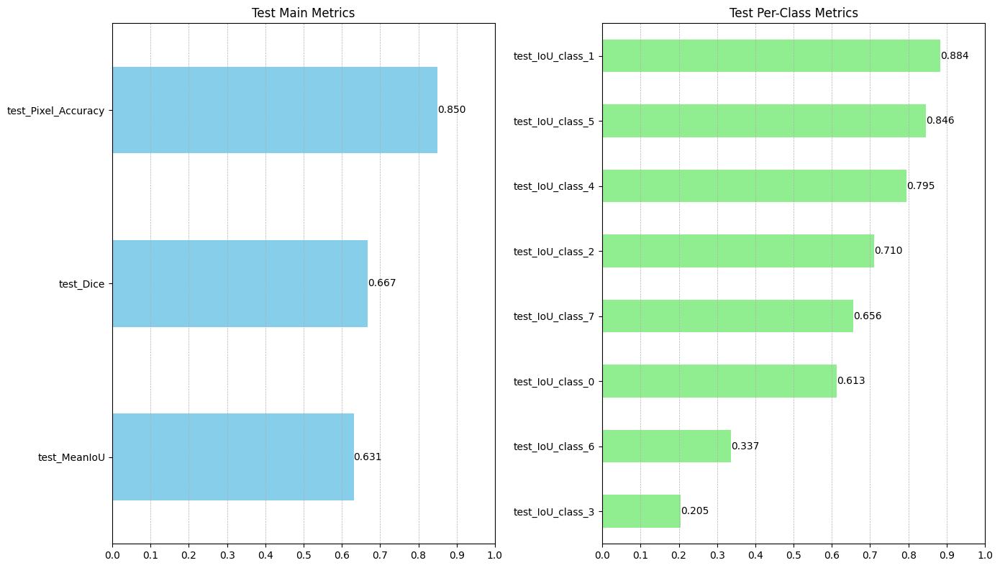

In [51]:
model_metric.plot_test_metrics()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step


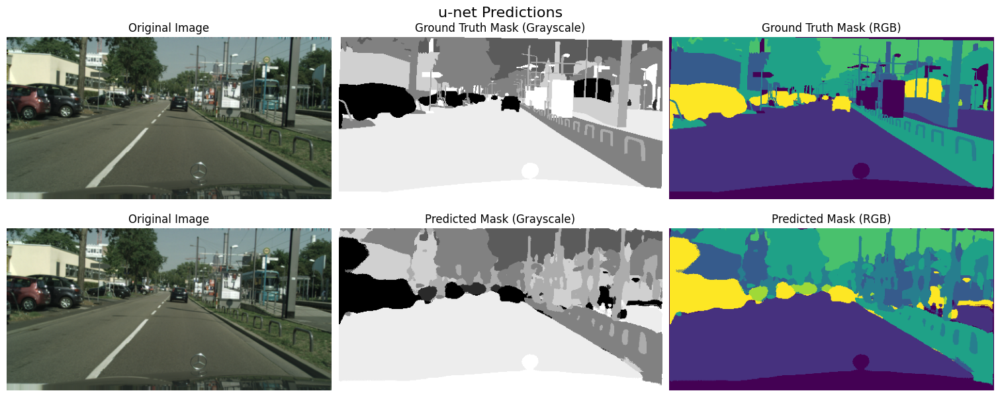

In [52]:
test_datagen.show_prediction(model=model, index=11)

In [53]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


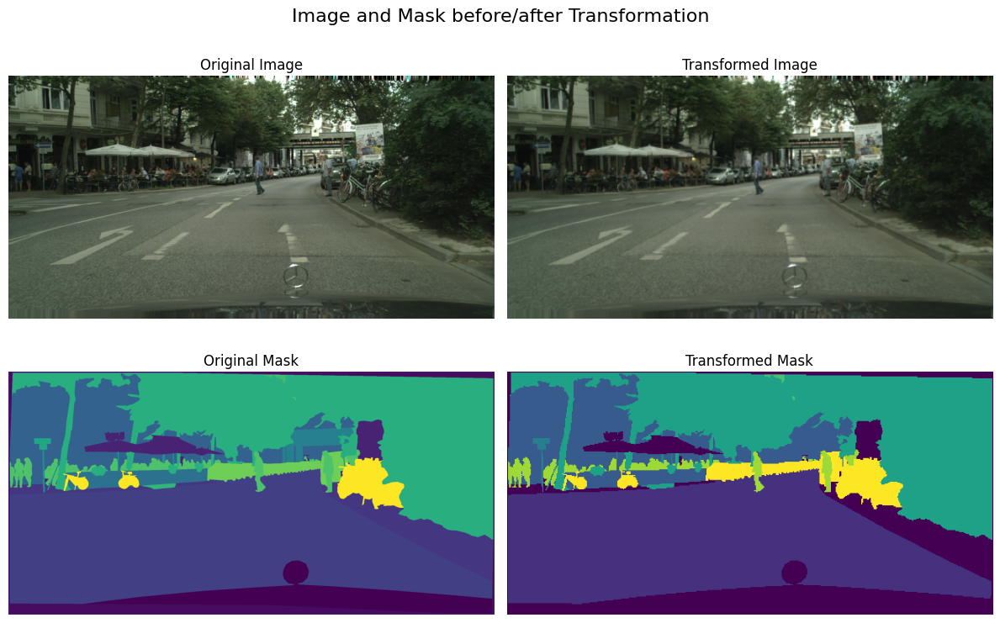

In [54]:
train_datagen.show_transformation(index=5)

## 52. DiceLoss & SCCE

In [55]:
train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

In [31]:
# Create the model
model = unet_model(input_shape=(256, 512, 3), num_classes=train_datagen.num_classes)

# Folder to create to store artifacts
new_folder = 52

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Define the loss function
loss_fn = DiceCrossEntropyLoss(
    num_classes=train_datagen.num_classes,
    from_logits=False,
    smooth=1e-6,
    alpha=0.8,
    name="dice_crossentropy_loss",
)


# Define the optimizer
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4)

# Compile the model
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
    # weighted_metrics=None,
    # steps_per_execution=1,
    # loss_weights=None,
)

# Train the model
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    callbacks=[checkpoint_callback, early_stopping],
)

Epoch 1/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3717s 25s/step - Dice: 0.3272 - IoU_class_0: 0.2409 - IoU_class_1: 0.5227 - IoU_class_2: 0.3180 - IoU_class_3: 0.1223 - IoU_class_4: 0.3130 - IoU_class_5: 0.3002 - IoU_class_6: 0.1556 - IoU_class_7: 0.2779 - MeanIoU: 0.2813 - Pixel_Accuracy: 0.5696 - loss: 1.0592 - val_Dice: 0.4191 - val_IoU_class_0: 0.4739 - val_IoU_class_1: 0.7603 - val_IoU_class_2: 0.2924 - val_IoU_class_3: 0.0000e+00 - val_IoU_class_4: 0.3692 - val_IoU_class_5: 0.3529 - val_IoU_class_6: 0.0000e+00 - val_IoU_class_7: 0.2714 - val_MeanIoU: 0.3150 - val_Pixel_Accuracy: 0.6491 - val_loss: 0.7315
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3703s 25s/step - Dice: 0.4529 - IoU_class_0: 0.4674 - IoU_class_1: 0.7828 - IoU_class_2: 0.3979 - IoU_class_3: 3.6901e-08 - IoU_class_4: 0.4414 - IoU_class_5: 0.5418 - IoU_class_6: 0.0000e+00 - IoU_class_7: 0.2569 - MeanIoU: 0.3610 - Pixel_Accuracy: 0.6871 - loss: 0.6797 - val_Dice: 0.5178 - val_IoU_class_0: 0.5140 - val_IoU_class_1: 0.8184 - val_Io

In [32]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights("../artifacts/52/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

32/32 ━━━━━━━━━━━━━━━━━━━━ 184s 6s/step - Dice: 0.7082 - IoU_class_0: 0.6901 - IoU_class_1: 0.9179 - IoU_class_2: 0.7198 - IoU_class_3: 0.2534 - IoU_class_4: 0.7984 - IoU_class_5: 0.8202 - IoU_class_6: 0.4188 - IoU_class_7: 0.7286 - MeanIoU: 0.6684 - Pixel_Accuracy: 0.8784 - loss: 0.3566
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step
Inference time on a unique prediction: 0.75 seconds


In [56]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/52/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/52/best_model.keras",
        custom_objects={
            "ResizeSkipFeatures": ResizeSkipFeatures,
            "DiceMetric": DiceMetric,
            # "DiceLoss": DiceLoss,
            "DiceCrossEntropyLoss": DiceCrossEntropyLoss,
            # "DiceFocalLoss": DiceFocalLoss,
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.learning_rate.value.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

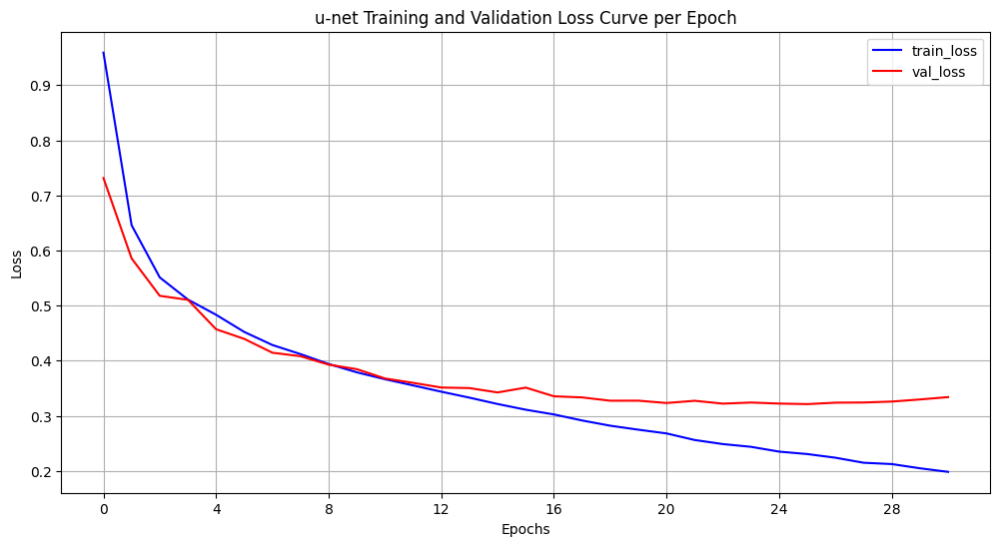

Best epoch:  25
Best Validation Loss:  0.3212


In [57]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

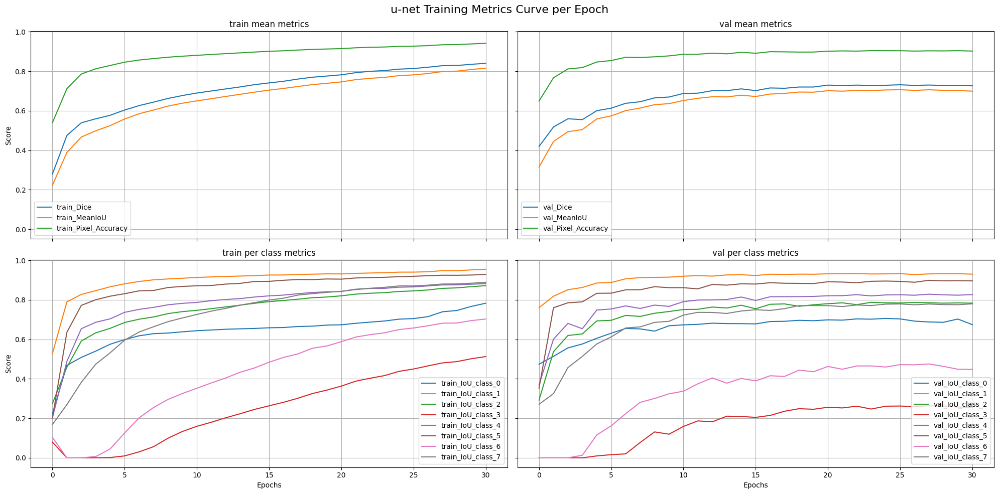

Best Validation MeanIoU:  0.7067
Best Validation Pixel Accuracy:  0.904
Best Validation Dice:  0.7316


In [58]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

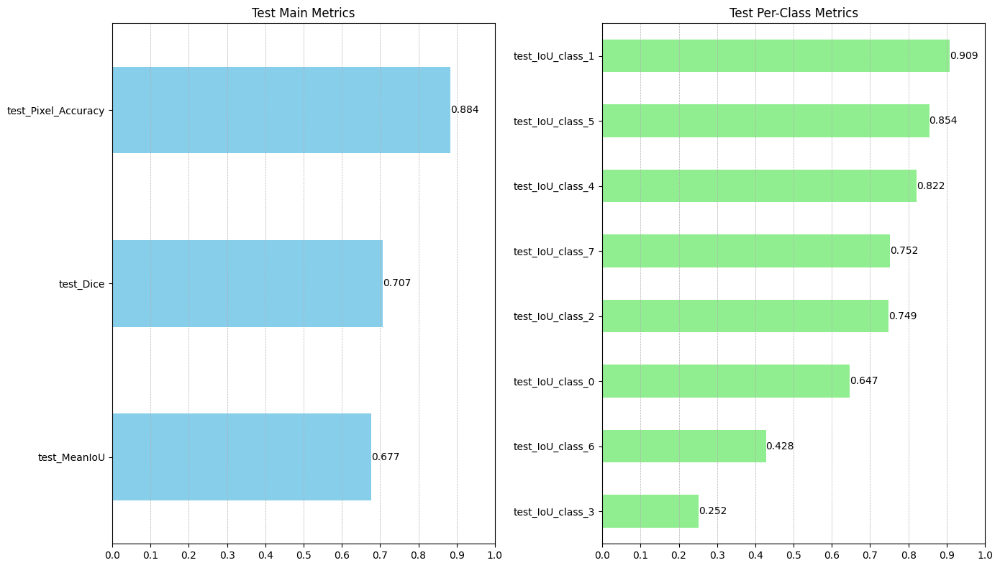

In [59]:
model_metric.plot_test_metrics()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


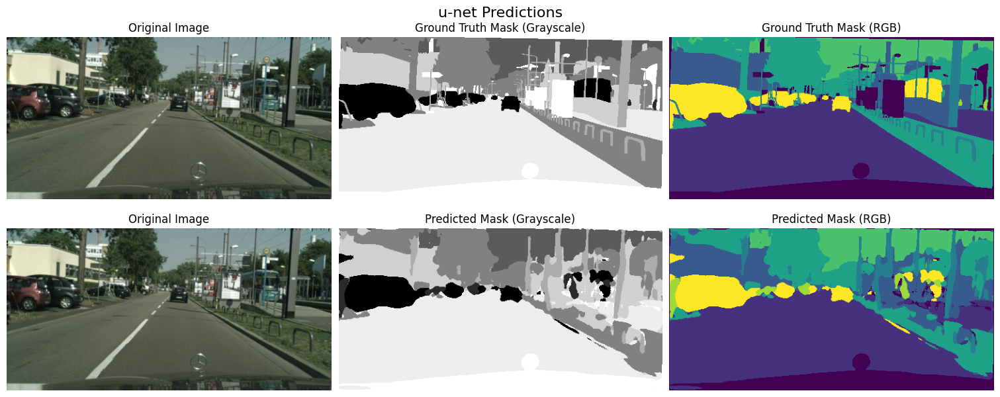

In [60]:
test_datagen.show_prediction(model=model, index=11)

In [61]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step


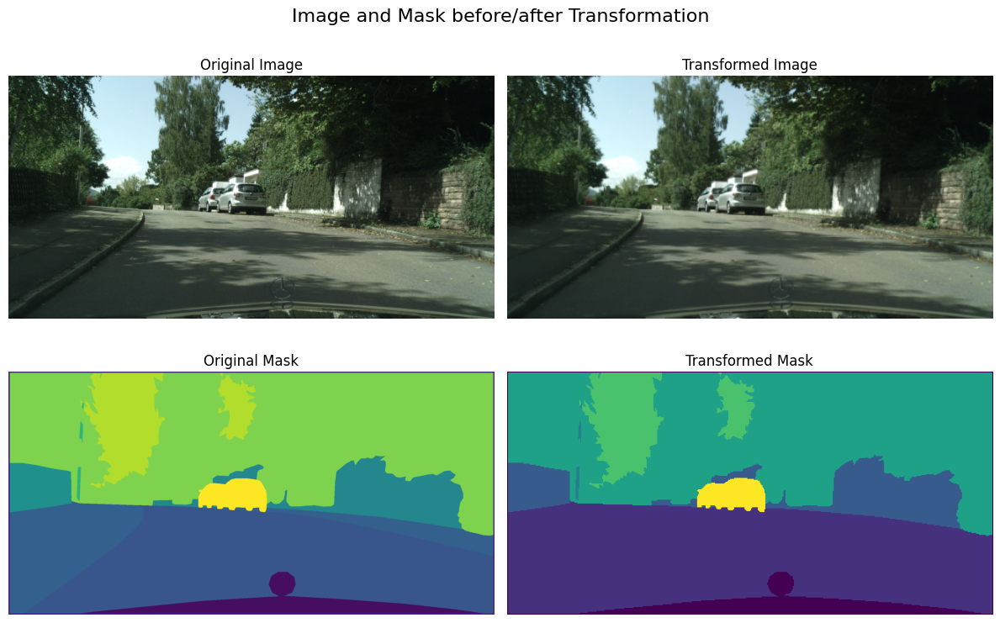

In [62]:
train_datagen.show_transformation(index=5)

## 53. FocalLoss & DICE

In [63]:
train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

In [ ]:
# Create the model
model = unet_model(input_shape=(256, 512, 3), num_classes=train_datagen.num_classes)

# Folder to create to store artifacts
new_folder = 53

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    from_logits=False,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)


# Define the optimizer
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4)

# Compile the model
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
    # weighted_metrics=None,
    # steps_per_execution=1,
    # loss_weights=None,
)

# Train the model
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    callbacks=[checkpoint_callback, early_stopping],
)

Epoch 1/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3755s 25s/step - Dice: 0.3458 - IoU_class_0: 0.2705 - IoU_class_1: 0.5317 - IoU_class_2: 0.3325 - IoU_class_3: 0.1199 - IoU_class_4: 0.3265 - IoU_class_5: 0.3573 - IoU_class_6: 0.2055 - IoU_class_7: 0.2913 - MeanIoU: 0.3044 - Pixel_Accuracy: 0.5900 - loss: 0.9484 - val_Dice: 0.4052 - val_IoU_class_0: 0.4142 - val_IoU_class_1: 0.7453 - val_IoU_class_2: 0.3864 - val_IoU_class_3: 0.0000e+00 - val_IoU_class_4: 0.3559 - val_IoU_class_5: 0.6683 - val_IoU_class_6: 0.0000e+00 - val_IoU_class_7: 0.0028 - val_MeanIoU: 0.3216 - val_Pixel_Accuracy: 0.6417 - val_loss: 0.6787
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3746s 25s/step - Dice: 0.4468 - IoU_class_0: 0.4061 - IoU_class_1: 0.7944 - IoU_class_2: 0.4533 - IoU_class_3: 1.7115e-06 - IoU_class_4: 0.4087 - IoU_class_5: 0.7247 - IoU_class_6: 0.0000e+00 - IoU_class_7: 0.1221 - MeanIoU: 0.3637 - Pixel_Accuracy: 0.6927 - loss: 0.6272 - val_Dice: 0.5369 - val_IoU_class_0: 0.4983 - val_IoU_class_1: 0.8367 - val_Io

In [ ]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights("../artifacts/53/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

32/32 ━━━━━━━━━━━━━━━━━━━━ 184s 6s/step - Dice: 0.7126 - IoU_class_0: 0.6700 - IoU_class_1: 0.9222 - IoU_class_2: 0.7319 - IoU_class_3: 0.2551 - IoU_class_4: 0.7996 - IoU_class_5: 0.8447 - IoU_class_6: 0.4423 - IoU_class_7: 0.7328 - MeanIoU: 0.6748 - Pixel_Accuracy: 0.8813 - loss: 0.3721
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
Inference time on a unique prediction: 0.77 seconds


In [64]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/53/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/53/best_model.keras",
        custom_objects={
            "ResizeSkipFeatures": ResizeSkipFeatures,
            "DiceMetric": DiceMetric,
            # "DiceLoss": DiceLoss,
            # "DiceCrossEntropyLoss": DiceCrossEntropyLoss,
            "DiceFocalLoss": DiceFocalLoss,
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.learning_rate.value.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

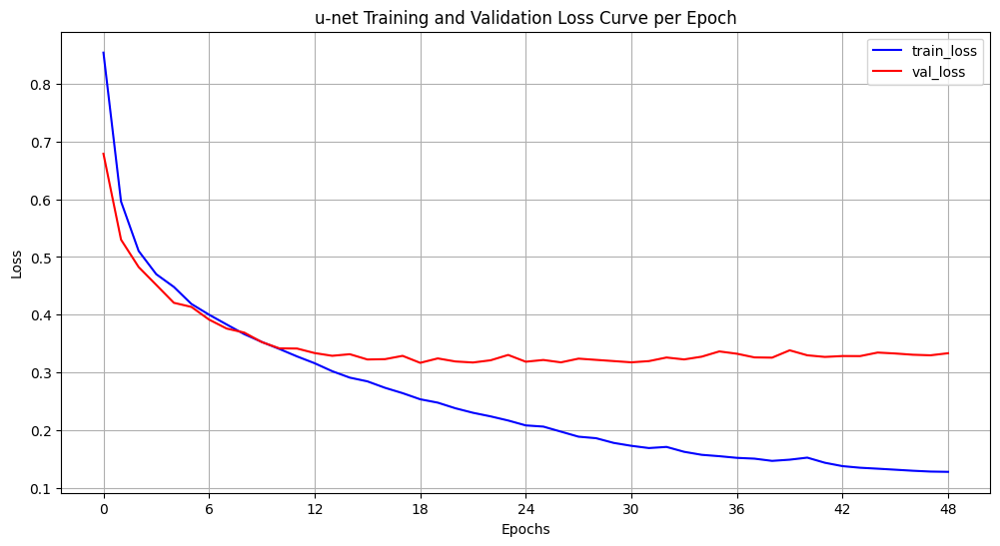

Best epoch:  43
Best Validation Loss:  0.3284


In [65]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

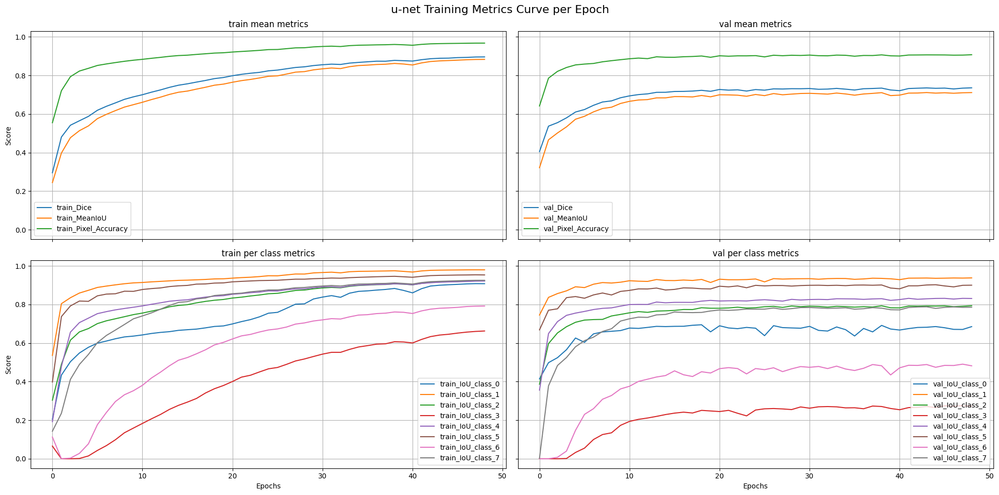

Best Validation MeanIoU:  0.7112
Best Validation Pixel Accuracy:  0.9065
Best Validation Dice:  0.7352


In [66]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

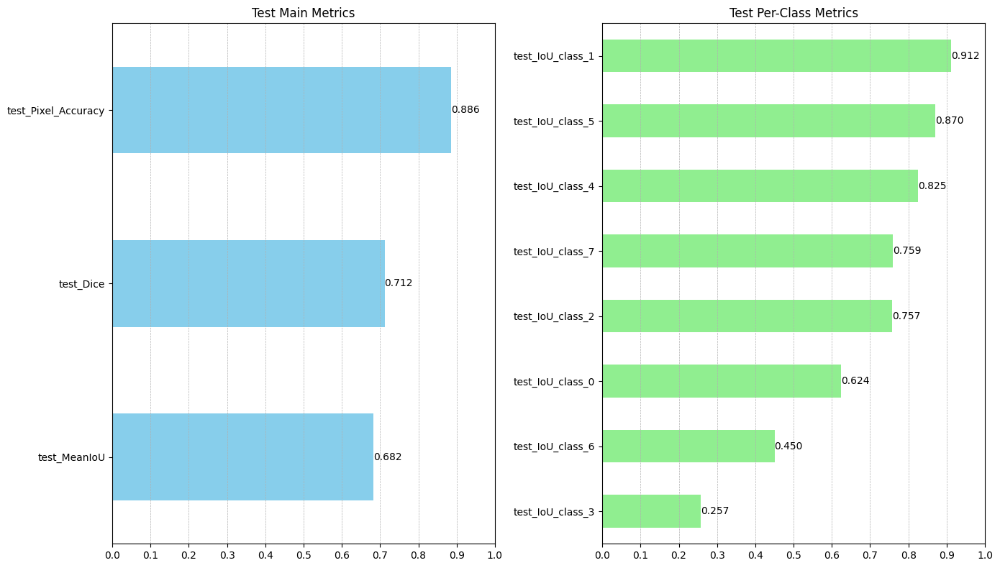

In [67]:
model_metric.plot_test_metrics()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


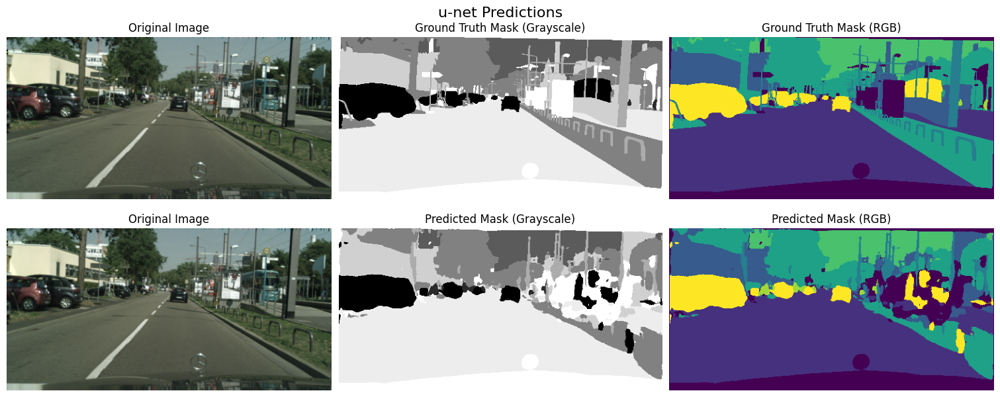

In [68]:
test_datagen.show_prediction(model=model, index=11)

In [69]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


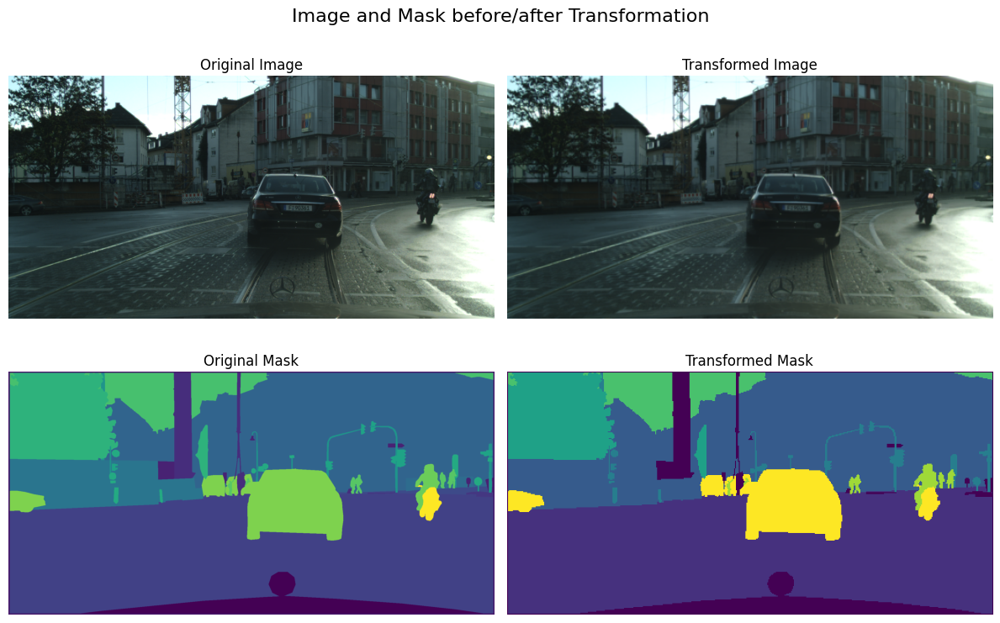

In [70]:
train_datagen.show_transformation(index=5)

## 54. BestLoss + DataAugmentation

In [71]:
train_datagen = ImageSegmentationDataset(
    paths=train_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=True,
    shuffle=True,
)

val_datagen = ImageSegmentationDataset(
    paths=val_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

test_datagen = ImageSegmentationDataset(
    paths=test_paths,
    labels=labels,
    batch_size=16,  # We won't use batches here
    target_size=TARGET_SIZE,
    workers=NUM_WORKERS,
    augmentations=False,
    shuffle=False,
)

In [22]:
# Create the model
model = unet_model(input_shape=(256, 512, 3), num_classes=train_datagen.num_classes)

# Folder to create to store artifacts
new_folder = 54

# Create a model checkpoint callback
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=f"../artifacts/{new_folder}/best_model.keras",  # Save under keras format to avoid WARNING
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to save the best model
    mode="max",
    save_best_only=True,
    verbose=0,
)

# Create an early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_MeanIoU",  # Set Mean IoU as the metric to monitor to stop the training
    patience=5,  # Epochs to wait before stopping
    mode="max",
    verbose=1,
)

# Create a ReduceLROnPlateau callback
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_MeanIoU",
    factor=0.5,  # Factor to reduce the learning rate
    patience=3,  # Epochs to wait before reducing the learning rate
    mode="max",
    min_lr=1e-6,  # Minimum learning rate
)

# Define the loss function
loss_fn = DiceFocalLoss(
    num_classes=train_datagen.num_classes,
    from_logits=False,
    smooth=1e-6,
    alpha=0.8,
    gamma=2.0,
    name="dice_focal_loss",
)


# Define the optimizer
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4)

# Compile the model
model.compile(
    optimizer=optimizer,
    loss=loss_fn,
    metrics=mean_metrics + per_class_metrics,
    # weighted_metrics=None,
    # steps_per_execution=1,
    # loss_weights=None,
)

# Train the model
history = model.fit(
    train_datagen,
    validation_data=val_datagen,
    epochs=50,
    callbacks=[checkpoint_callback, early_stopping, reduce_lr],
)

Epoch 1/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3705s 25s/step - Dice: 0.1359 - IoU_class_0: 0.0425 - IoU_class_1: 0.3348 - IoU_class_2: 0.1797 - IoU_class_3: 0.0025 - IoU_class_4: 0.0572 - IoU_class_5: 0.0710 - IoU_class_6: 0.0000e+00 - IoU_class_7: 0.0076 - MeanIoU: 0.0869 - Pixel_Accuracy: 0.3524 - loss: 0.9557 - val_Dice: 0.4361 - val_IoU_class_0: 0.4574 - val_IoU_class_1: 0.7348 - val_IoU_class_2: 0.4065 - val_IoU_class_3: 0.0000e+00 - val_IoU_class_4: 0.2794 - val_IoU_class_5: 0.6351 - val_IoU_class_6: 0.0000e+00 - val_IoU_class_7: 0.2120 - val_MeanIoU: 0.3406 - val_Pixel_Accuracy: 0.6635 - val_loss: 0.6382 - learning_rate: 1.0000e-04
Epoch 2/50
149/149 ━━━━━━━━━━━━━━━━━━━━ 3698s 25s/step - Dice: 0.4534 - IoU_class_0: 0.4430 - IoU_class_1: 0.7657 - IoU_class_2: 0.3984 - IoU_class_3: 0.0000e+00 - IoU_class_4: 0.3798 - IoU_class_5: 0.6933 - IoU_class_6: 5.7806e-06 - IoU_class_7: 0.2617 - MeanIoU: 0.3678 - Pixel_Accuracy: 0.6764 - loss: 0.6163 - val_Dice: 0.5097 - val_IoU_class_0: 0.4883 - 

In [23]:
# Recharge les meilleurs poids enregistrés lors de l'entraînement
model.load_weights("../artifacts/54/best_model.keras")

# Evaluation on the test set
results = model.evaluate(test_datagen, return_dict=True)

# Get a fixed test img for computing inference time and for further visualization
start_time = time.time()
img_preds = test_datagen.get_prediction(model, 11)
end_time = time.time()
inference_time = end_time - start_time
print(f"Inference time on a unique prediction: {end_time - start_time:.2f} seconds")

32/32 ━━━━━━━━━━━━━━━━━━━━ 185s 6s/step - Dice: 0.7361 - IoU_class_0: 0.6827 - IoU_class_1: 0.9283 - IoU_class_2: 0.7470 - IoU_class_3: 0.3182 - IoU_class_4: 0.8162 - IoU_class_5: 0.8587 - IoU_class_6: 0.5019 - IoU_class_7: 0.7570 - MeanIoU: 0.7012 - Pixel_Accuracy: 0.8908 - loss: 0.3202
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
Inference time on a unique prediction: 0.69 seconds


In [72]:
try:
    model_metric = ModelMetric.from_pickle(
        pickle_path="../artifacts/54/model_metric.pkl"
    )
    model = tf.keras.models.load_model(
        "../artifacts/54/best_model.keras",
        custom_objects={
            "ResizeSkipFeatures": ResizeSkipFeatures,
            "DiceMetric": DiceMetric,
            # "DiceLoss": DiceLoss,
            # "DiceCrossEntropyLoss": DiceCrossEntropyLoss,
            "DiceFocalLoss": DiceFocalLoss,
        },
    )

except FileNotFoundError:
    # Set the extra_metrics to save in the ModelMetric object
    extra_metrics = {
        "experiment_folder": new_folder,  # experiment_folder is mandatory to save the metrics
        "inference_time": inference_time,
        "classes": train_datagen.num_classes,
        "train_samples": train_datagen.num_samples,
        "val_samples": val_datagen.num_samples,
        "test_samples": test_datagen.num_samples,
        "train_batches": len(train_datagen),
        "augmentations": str(train_datagen.augmentations),
        "normalize": str(train_datagen.normalize),
        "loss_fn": loss_fn.name,
        "optimizer": optimizer.__class__.__name__,
        "learning_rate": float(optimizer.learning_rate.value.numpy()),
        # "weight_decay": float(optimizer.weight_decay.value.numpy()),
    }

    # Create the ModelMetric object
    model_metric = ModelMetric(
        history=history,
        results=results,
        extra_metrics=extra_metrics,
        monitor="val_MeanIoU",
        best_monitor="max",
    )

    # Save the metrics
    model_metric.save_metrics()

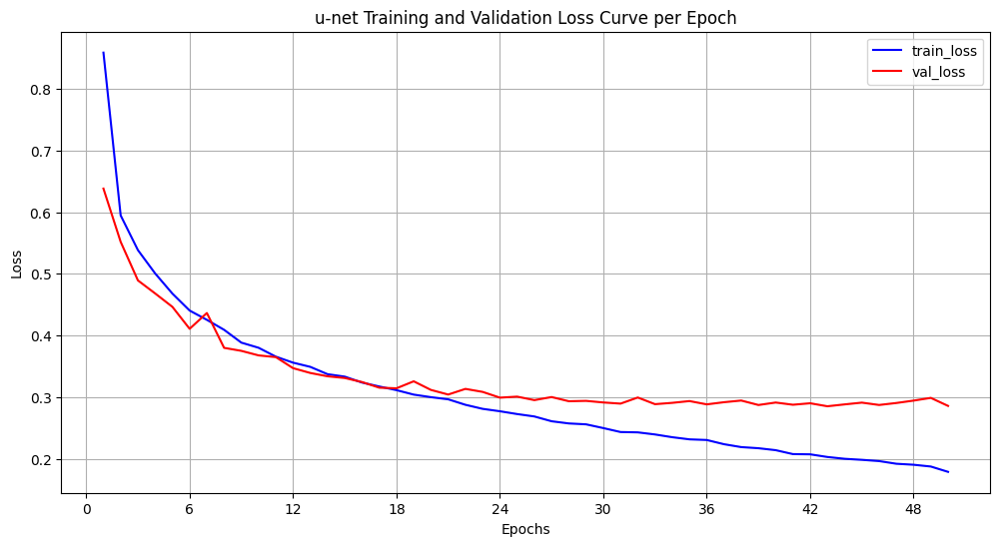

Best epoch:  49
Best Validation Loss:  0.286


In [73]:
model_metric.plot_loss()
print("Best epoch: ", model_metric.best_epoch)
print("Best Validation Loss: ", round(model_metric.metrics_df["val_loss"].values[0], 4))

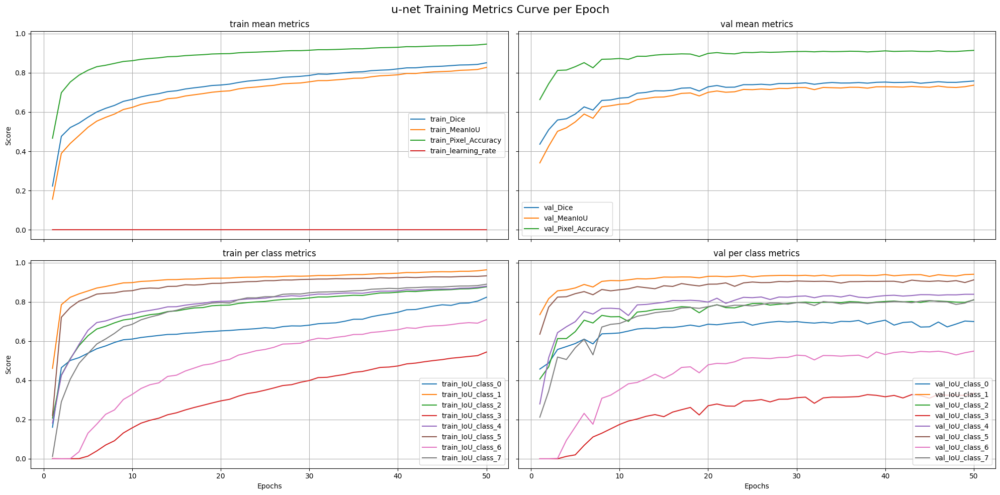

Best Validation MeanIoU:  0.737
Best Validation Pixel Accuracy:  0.9144
Best Validation Dice:  0.7582


In [74]:
model_metric.plot_train_metrics()
print(
    "Best Validation MeanIoU: ",
    round(model_metric.metrics_df["val_MeanIoU"].values[0], 4),
)
print(
    "Best Validation Pixel Accuracy: ",
    round(model_metric.metrics_df["val_Pixel_Accuracy"].values[0], 4),
)
print(
    "Best Validation Dice: ",
    round(model_metric.metrics_df["val_Dice"].values[0], 4),
)

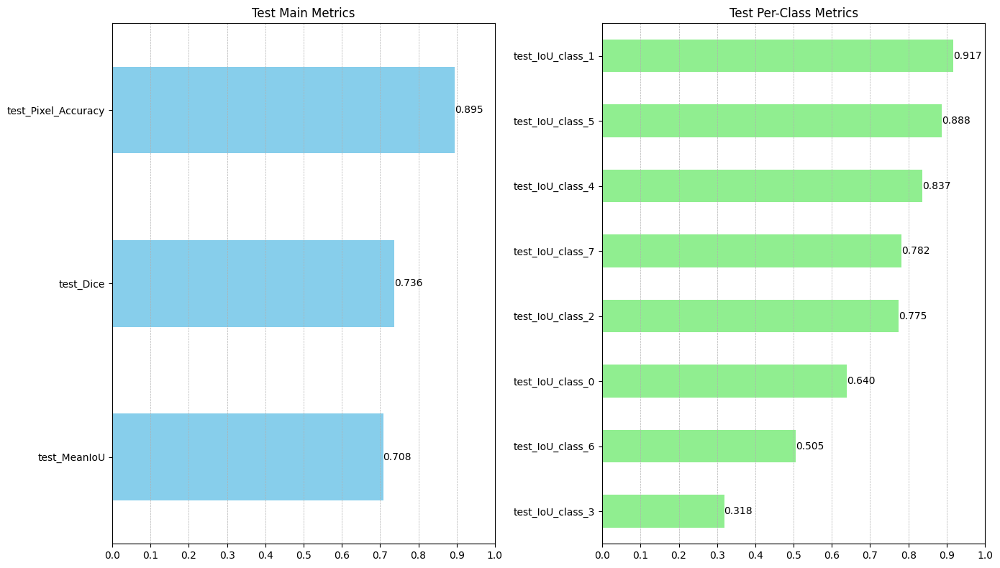

In [75]:
model_metric.plot_test_metrics()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


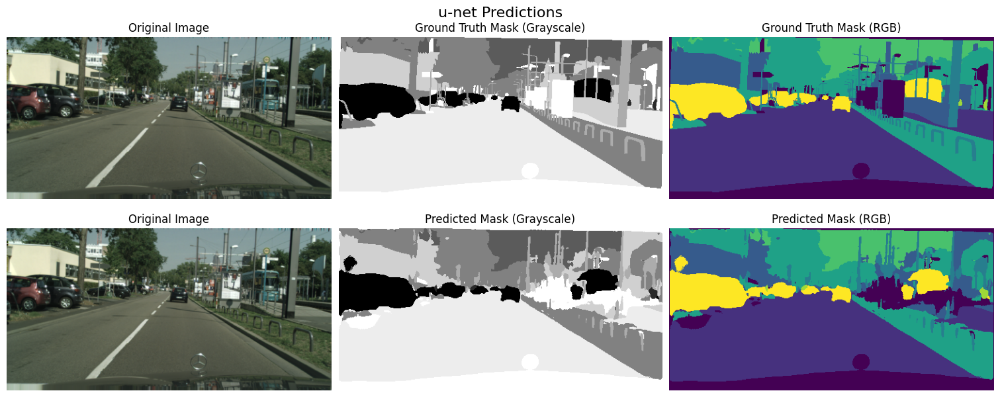

In [76]:
test_datagen.show_prediction(model=model, index=11)

In [77]:
mask_pred = test_datagen.get_prediction(model, 0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step


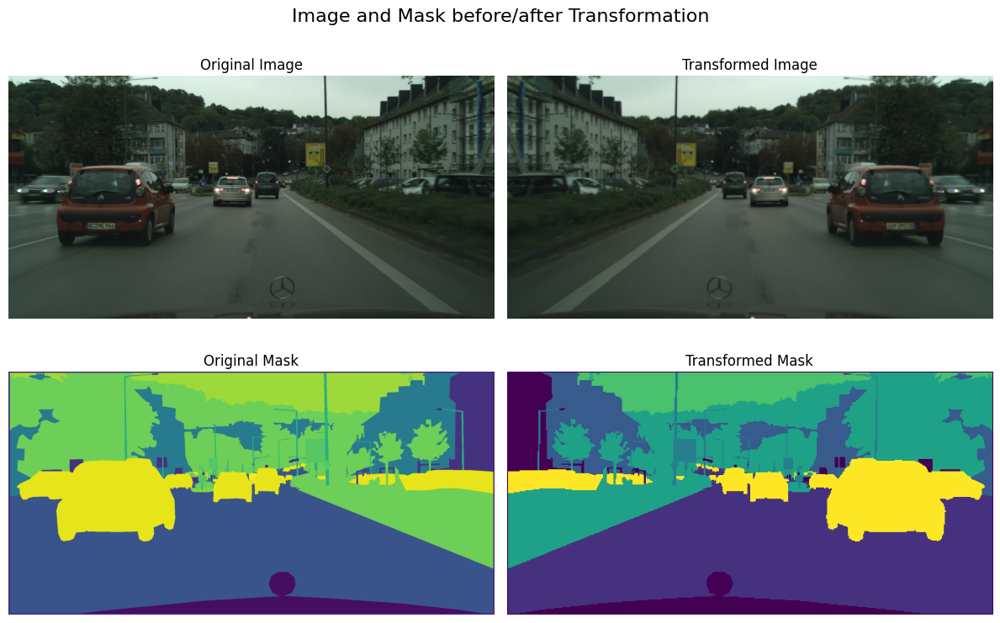

In [78]:
train_datagen.show_transformation(index=5)

## Résultats

- Problèmes relevés :
    - Overfitting sur l’ensemble d'entraînement accompagné d’une stabilisation (et parfois une fluctuation) des scores en validation.
    - Les classes minoritaires semblent moins bien apprises, ce qui suggère des limites dans la généralisation du modèle sur l’ensemble des classes.

- Actions entreprises et pistes d’amélioration :
    - Utilisation du callback ReduceLROnPlateau pour diminuer le taux d’apprentissage lors des oscillations du score de validation.
    - Intégration d’augmentations de données pour augmenter la diversité des exemples, réduire le surapprentissage et améliorer la robustesse du modèle.
    - Pour améliorer la représentation des classes peu fréquentes :
        - Envisager d’utiliser des encodeurs pré-entraînés et de finetuner uniquement le décodeur, permettant de séparer l’apprentissage des deux parties.
        - Explorer l’utilisation de fonctions de perte alternatives telles que la Tversky Loss ou une combinaison Dice Loss/Tversky Loss, offrant un meilleur contrôle sur les faux positifs et négatifs.
    - Ajustements complémentaires :
        - Optimisation des hyperparamètres (taux d’apprentissage, stratégies de rééchantillonnage).
        - La combinaise de la Dice Loss et de la Focal Loss a montré des résultats prometteurs, mais nécessite une évaluation plus approfondie.

- Observations détaillées des métriques :
    - Les métriques agrégées (MeanIoU, Dice, Pixel Accuracy) et par classe indiquent que, malgré de bonnes performances globales, certaines classes restent sous-performantes.
    - L’utilisation de stratégies telles que l’augmentation de données et l’ajustement dynamique du learning rate a montré un impact positif sur la courbe de perte et la generalisation du modèle.

Globalement, la démarche expérimentale démontre qu’en combinant une réduction dynamique du taux d’apprentissage, une augmentation de la diversité des données et l’exploration de fonctions de perte adaptées, il est possible de faire face aux problèmes d’overfitting et de déséquilibre entre classes, tout en cherchant à optimiser la performance globale du modèle de segmentation.

Pour conclure, nous avons réussi à augmenter à chaque étape le score de validation et de test en jouant sur les différentes fonctions de pertes et d'augmentation des données.<br>
Pour la seconde phase d'évaluation, je testerai l'utilisation d'encodeurs pré-entraînés et de finetuner uniquement le décodeur, permettant de séparer l’apprentissage des deux parties.<br>